# **Customer churn prediction: Telecom Churn Dataset**

# **1. Introduction**
---



***Project Objective***

In the highly competitive telecom industry, customer retention is critical. Companies face significant challenges when customers churn, which leads to revenue loss and increased costs to acquire new customers. This project aims to predict customer churn using machine learning techniques to help telecom companies identify at-risk customers and implement effective retention strategies. By leveraging predictive analytics, the project seeks to:

1 - Identify patterns and factors contributing to customer churn.

2 - Build accurate and interpretable models to predict churn.

3 -  Provide actionable insights to improve customer retention.

***Overview of the Dataset***

The datasets used in this project, churn-bigml-80.csv and churn-bigml-20.csv, come from the telecom sector and contain detailed information about customer demographics, service usage, and account details. These datasets are split into:

* churn-bigml-80.csv: The training dataset containing 80% of the data, used to train the machine learning models.
* churn-bigml-20.csv: The testing dataset containing 20% of the data, used to evaluate the model's performance on unseen data.

***Key Questions to Answer***

This project aims to address the following questions:

* What are the primary factors driving customer churn in the telecom industry?
* Can machine learning models accurately predict customers at risk of churning?
* How can we visualize and interpret the predictions to guide decision-making?


# **2. Business Understanding**


---


**Importance of Churn Prediction in the Telecom Industry**

The telecom industry operates in a highly competitive environment where retaining existing customers is significantly more cost-effective than acquiring new ones. Research indicates that acquiring a new customer can cost up to five times more than retaining an existing one. Customer churn—the process of customers discontinuing their services—directly impacts revenue, market share, and brand reputation. Addressing churn effectively can lead to:

1. Increased customer lifetime value.
2. Improved profitability through targeted retention strategies.*
3. Enhanced brand loyalty and competitive advantage.*

**Challenges Addressed by Machine Learning**

Traditional methods of churn prediction often rely on manual analyses and predefined business rules, which can be:

Time-Consuming: Inefficient in handling large, dynamic datasets.
Limited in Scope: Unable to capture complex, non-linear relationships in customer behavior.
Reactive: Focusing on churn prevention only after early signs of dissatisfaction become apparent.
Machine learning (ML) overcomes these limitations by:

Automating the discovery of churn patterns in historical data.
Providing real-time, scalable solutions for predicting churn.
Offering interpretable insights into customer behavior for proactive retention strategies.

**Key Features in the Dataset**

The dataset used for this project includes a variety of attributes that are critical to understanding and predicting churn. These can be grouped into the following categories:

*1- Customer Demographics:*
* State
* Area Code

*2- Service Usage:*

Types of services subscribed (e.g., international, voice, day/eve/night calls).

*3- Account Information:*

* Account Length

*4- Target Variable:*

Churn: Indicates whether a customer has discontinued the service (binary: Yes/No).
These features provide valuable insights into customer behavior and their likelihood of churning.

**Expected Outcomes**

By predicting churn, this project aims to:

- Identify customers most likely to leave the service.
- Understand the factors driving their decision to churn.
- Enable telecom companies to:
  1. Design personalized offers and incentives for at-risk customers.
  2. Optimize customer service and engagement strategies.
  3. Reduce overall churn rates and enhance profitability.




In [1]:
#Importing libraries
import numpy as np
import pandas as pd
from math import *
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import itertools
import io
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings("ignore")
import os

%matplotlib inline

In [2]:
import plotly
print(plotly.__version__)


5.9.0


# **3. Data Understanding**



---



In [3]:
# After uploading, load the datasets
telcom = pd.read_csv('churn-bigml-80.csv')
telcom_test = pd.read_csv('churn-bigml-20.csv')

# Check if files loaded correctly by displaying the first few rows
print(telcom.head())
print(telcom_test.head())

  State  Account length  Area code International plan Voice mail plan  \
0    KS             128        415                 No             Yes   
1    OH             107        415                 No             Yes   
2    NJ             137        415                 No              No   
3    OH              84        408                Yes              No   
4    OK              75        415                Yes              No   

   Number vmail messages  Total day minutes  Total day calls  \
0                     25              265.1              110   
1                     26              161.6              123   
2                      0              243.4              114   
3                      0              299.4               71   
4                      0              166.7              113   

   Total day charge  Total eve minutes  Total eve calls  Total eve charge  \
0             45.07              197.4               99             16.78   
1             27.47   

In [4]:
telcom.shape

(2666, 20)

In [5]:
telcom_test.shape

(667, 20)

In [6]:
def dataoveriew(df, message):
    print(f'{message}:\n')
    print("Rows:", df.shape[0])
    print("\nNumber of features:", df.shape[1])
    print("\nFeatures:")
    print(telcom.columns.tolist())
    print("\nMissing values:", df.isnull().sum().values.sum())
    print("\nUnique values:")
    print(df.nunique())

In [7]:
dataoveriew(telcom, 'Overiew of the training dataset')

Overiew of the training dataset:

Rows: 2666

Number of features: 20

Features:
['State', 'Account length', 'Area code', 'International plan', 'Voice mail plan', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Churn']

Missing values: 0

Unique values:
State                       51
Account length             205
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       42
Total day minutes         1489
Total day calls            115
Total day charge          1489
Total eve minutes         1442
Total eve calls            120
Total eve charge          1301
Total night minutes       1444
Total night calls          118
Total night charge         885
Total intl minutes         15

In [8]:
dataoveriew(telcom_test, 'Overiew of the test dataset')

Overiew of the test dataset:

Rows: 667

Number of features: 20

Features:
['State', 'Account length', 'Area code', 'International plan', 'Voice mail plan', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Churn']

Missing values: 0

Unique values:
State                      51
Account length            179
Area code                   3
International plan          2
Voice mail plan             2
Number vmail messages      37
Total day minutes         562
Total day calls           100
Total day charge          562
Total eve minutes         557
Total eve calls            94
Total eve charge          528
Total night minutes       568
Total night calls          96
Total night charge        453
Total intl minutes        132
Total intl calls   

As provided, there are no missing values in both datasets, so we won't need to impute them later on.

In [9]:
summary = (telcom[[i for i in telcom.columns]].
           describe().transpose().reset_index())

summary = summary.rename(columns = {"index" : "feature"})
summary = np.around(summary,3)

val_lst = [summary['feature'], summary['count'],
           summary['mean'],summary['std'],
           summary['min'], summary['25%'],
           summary['50%'], summary['75%'], summary['max']]

trace  = go.Table(header = dict(values = summary.columns.tolist(),
                                line = dict(color = ['#506784']),
                                fill = dict(color = ['#119DFF']),
                               ),
                  cells  = dict(values = val_lst,
                                line = dict(color = ['#506784']),
                                fill = dict(color = ["lightgrey",'#F5F8FF'])
                               ),
                  columnwidth = [200,60,100,100,60,60,80,80,80])
layout = go.Layout(dict(title = "Training variable Summary"))
figure = go.Figure(data=[trace],layout=layout)

# Show the figure
figure.show()

* **Customer churn in data**


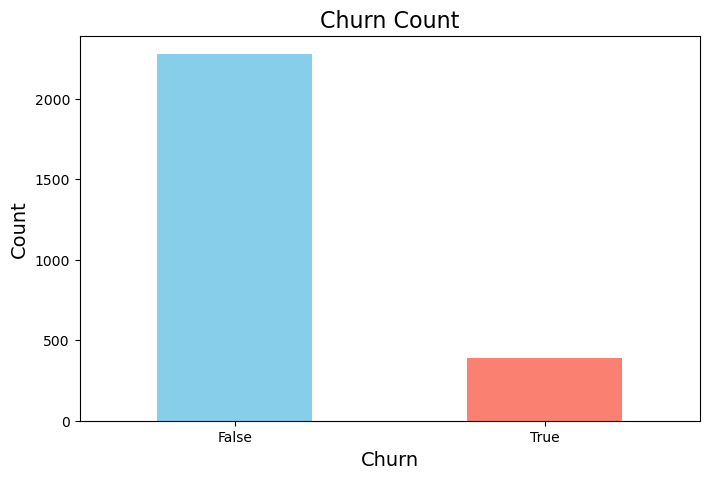

In [10]:
# Count the number of True and False values in Churn
churn_counts = telcom['Churn'].value_counts()

# Plot using Pandas
churn_counts.plot(kind='bar', figsize=(8, 5), color=['skyblue', 'salmon'])

# Add titles and labels
plt.title('Churn Count', fontsize=16)
plt.xlabel('Churn', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks([0, 1], labels=['False', 'True'], rotation=0)  # Adjust tick labels
plt.show()


* We can remark that the number of churners is quite low compared to the number of non-churners but we must still focus on churn causes in order to provide insight for telecommunications companies to build solid retention business techniques.
* During Modeling we will recourse to Synthetic Minority Oversampling TEchnique (SMOTE) in some techniques to have better results.
* We will also focus on improving f1-score during modeling.


* **Check the feature importance of State**

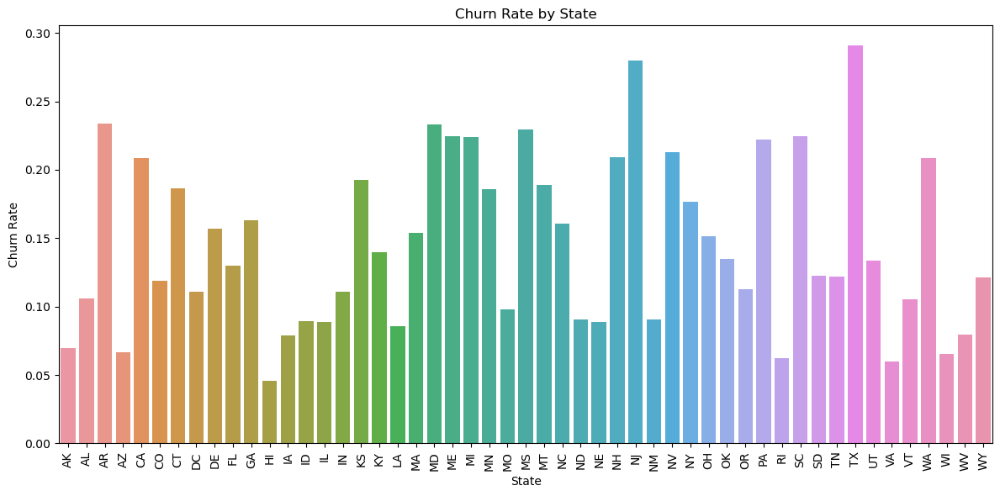

In [11]:
# Calculate churn rate for each state
state_churn_rate = telcom.groupby('State')['Churn'].mean().reset_index()

# Create the grouped bar chart
plt.figure(figsize=(12, 6))  # Adjust figure size as needed
sns.barplot(x='State', y='Churn', data=state_churn_rate)
plt.title('Churn Rate by State')
plt.xlabel('State')
plt.ylabel('Churn Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

ALthough the churn rate varies considerably within states i.e as low as 0.05 for HI (Hawaii) and as high as ~0.3 for TX (Texas), meaning that State is a seamingly statistically important feature for Churn, it can add unnecessary complexity, overfit to local patterns, or duplicate information captured by other features.

* **Feature importance of Area Code**

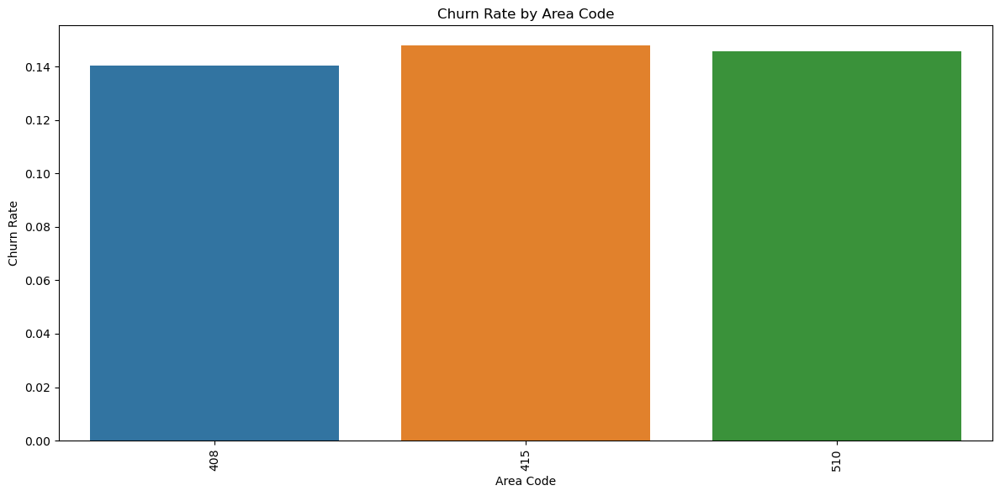

In [12]:
# Calculate churn rate for each area code
state_churn_rate = telcom.groupby('Area code')['Churn'].mean().reset_index()

# Create the grouped bar chart
plt.figure(figsize=(12, 6))  # Adjust figure size as needed
sns.barplot(x='Area code', y='Churn', data=state_churn_rate)
plt.title('Churn Rate by Area Code')
plt.xlabel('Area Code')
plt.ylabel('Churn Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

Since the churn rate has quite low variability between area codes, it seems that Area Code is statistically insignificant in explaining and thus predicting Churn in the Telecom Industries

* **Distribution of variables**

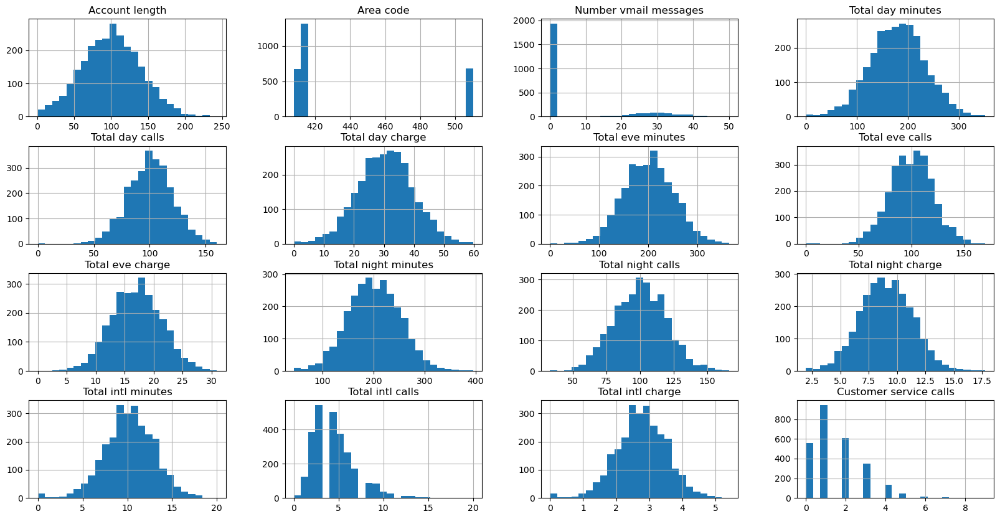

In [13]:
#displays the distribution of our dataset by a histogram.
telcom.hist(bins=25,figsize=(20,10));

* **Pairplot distributions** (check for relationships)

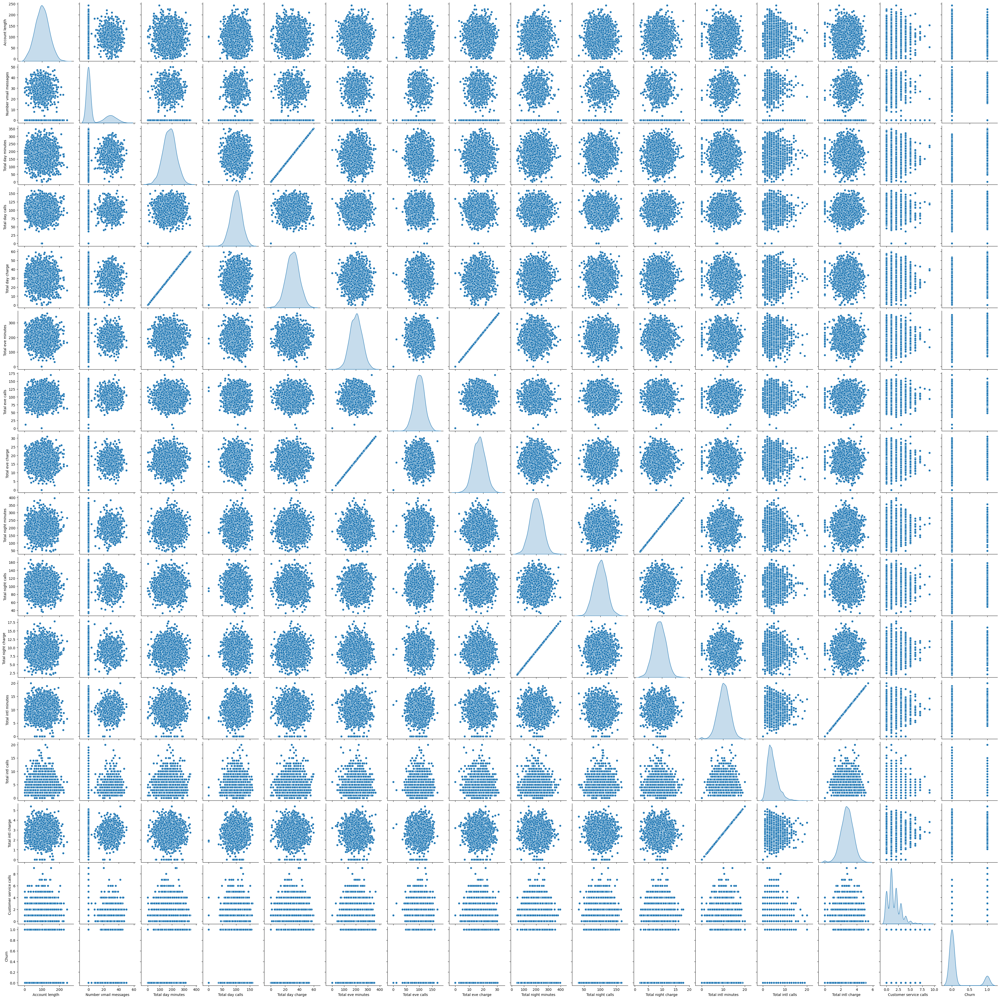

In [14]:
#Separating columns to be visualized
out_cols = list(set(telcom.nunique()[telcom.nunique()<6].keys().tolist()
                    + telcom.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in telcom.columns if x not in out_cols] + ['Churn']

sns.pairplot(telcom[viz_cols], diag_kind="kde")
plt.show()

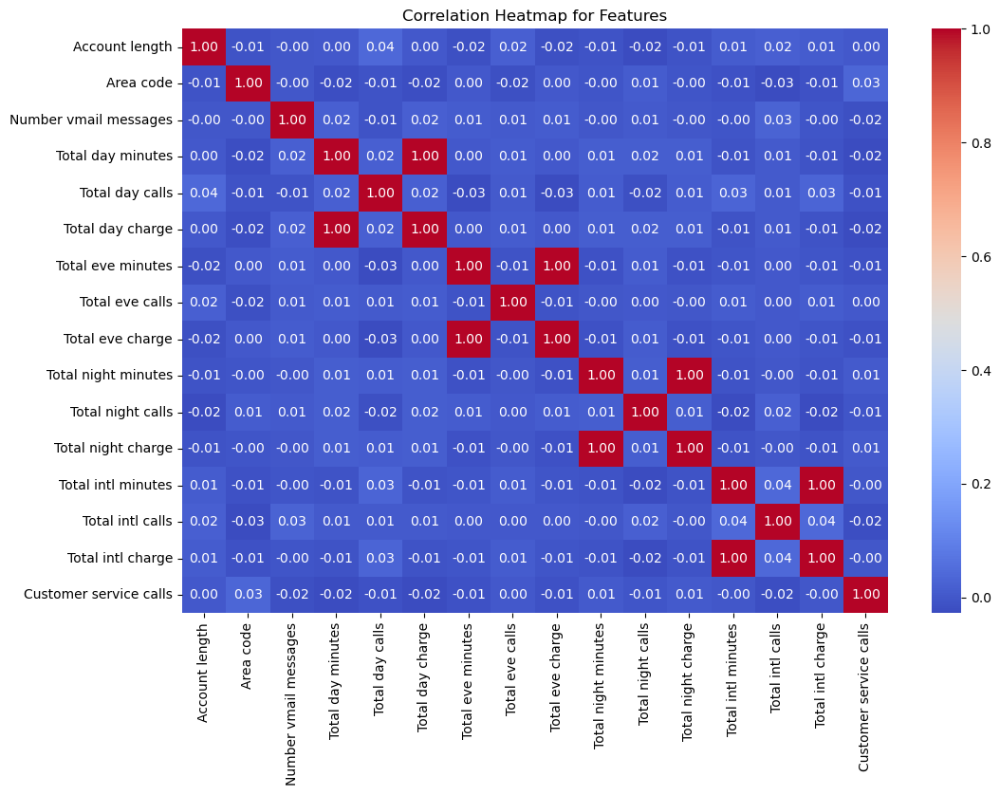

In [15]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
# Select only numeric columns from the DataFrame
numeric_telcom = telcom.select_dtypes(include=['number'])

# Compute the correlation matrix
correlation = numeric_telcom.corr()
sns.heatmap(correlation, annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Heatmap for Features")
plt.show()

Multiple numerical variables have a multicolinearility problem according to both charts.
* ( Total day minutes and Total day charge)
* (Total eve minutes and Total eve charge)
* (Total night minutes and Total night charge)
* (Total intl minutes and Total intl charge)  
We only have to select one of them for each pair.

# **4. Data Pre-processing**


---



* **Feature Selection**

We'll drop all the *charge* columns since they're multicolinear with their pairs as well as the Area code column since it's unecessary


In [16]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

#Removing correlated and unneccessary columns
col_to_drop = ['Total day charge', 'Total eve charge',
               'Total night charge', 'Total intl charge', 'Area code', 'State']

telcom = telcom.drop(columns = col_to_drop, axis = 1)
telcom_test = telcom_test.drop(columns = col_to_drop, axis = 1)

* **Identifying different types of columns**

In [17]:
#target column
target_col = ["Churn"]

#Separating categorical and numerical columns
#numerical columns
num_cols = ['Account length',
            'Number vmail messages',
            'Total day minutes',
            'Total day calls',
            'Total eve minutes',
            'Total eve calls',
            'Total night minutes',
            'Total night calls',
            'Total intl minutes',
            'Total intl calls',
            'Customer service calls']
#Binary columns with 2 values
bin_cols = ['International plan', 'Voice mail plan', 'Churn']

* **Checking Outliers for the numerical variables**

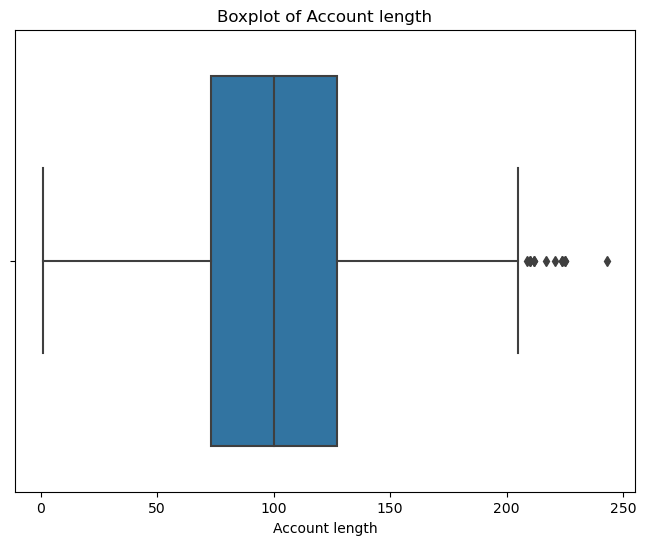

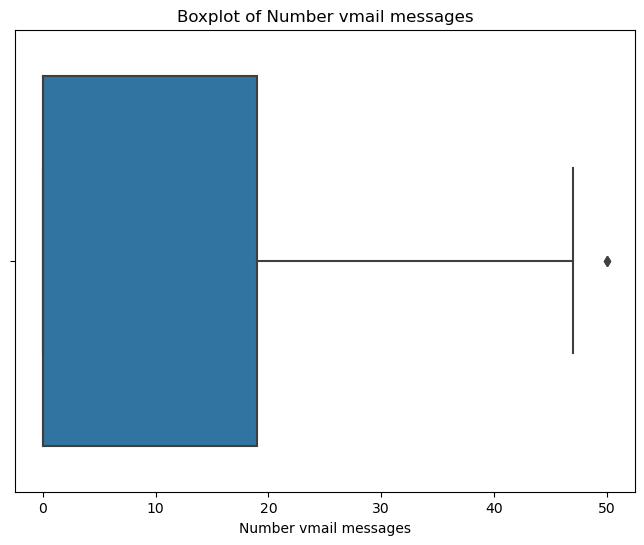

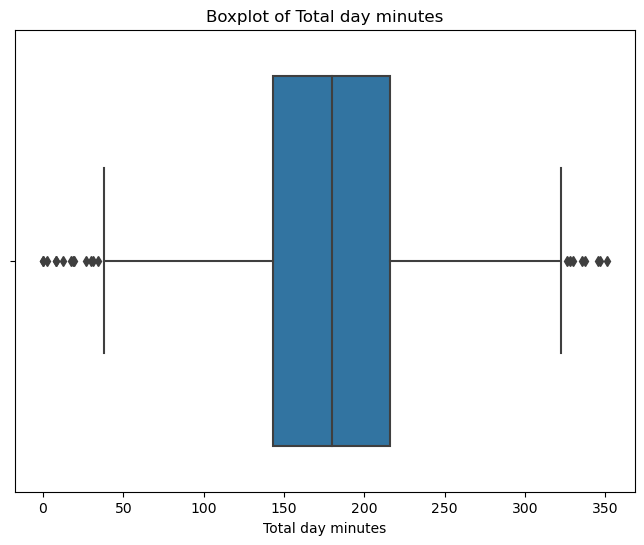

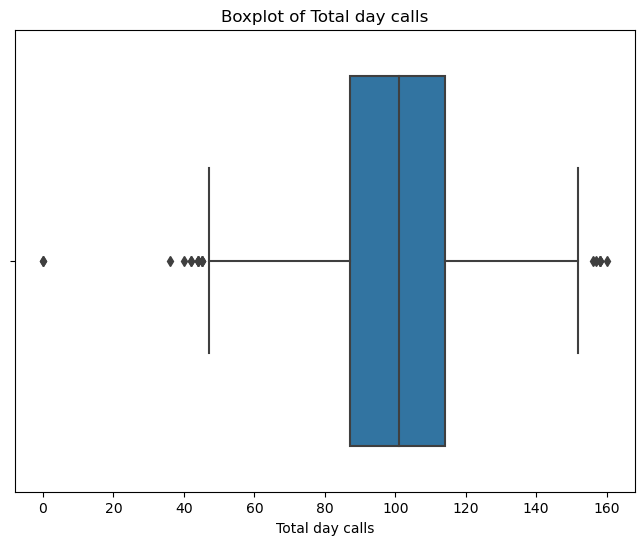

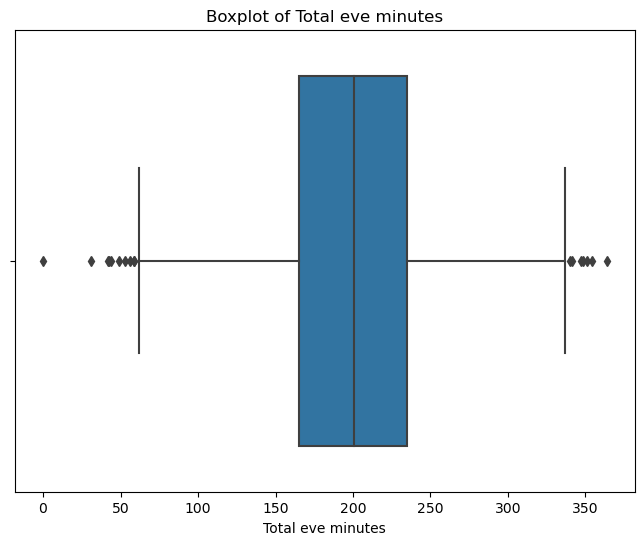

...

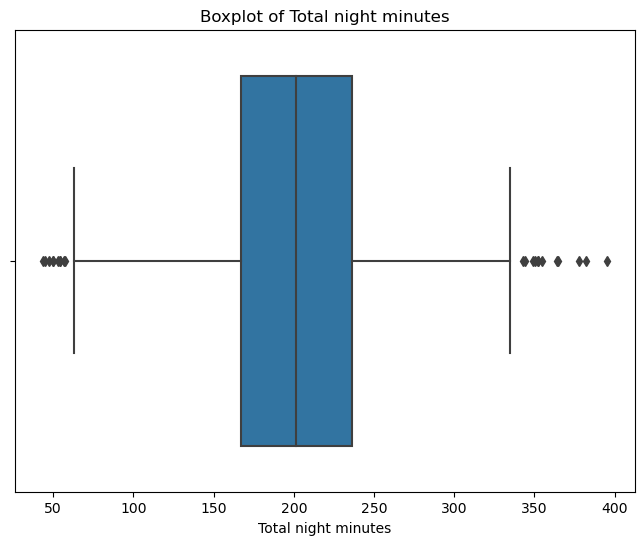

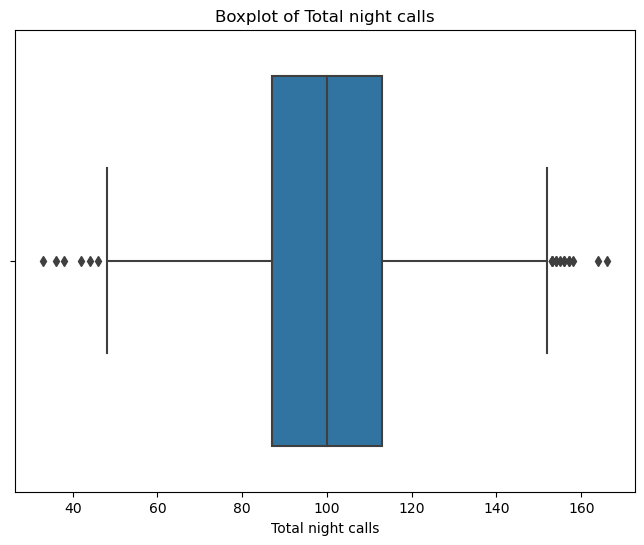

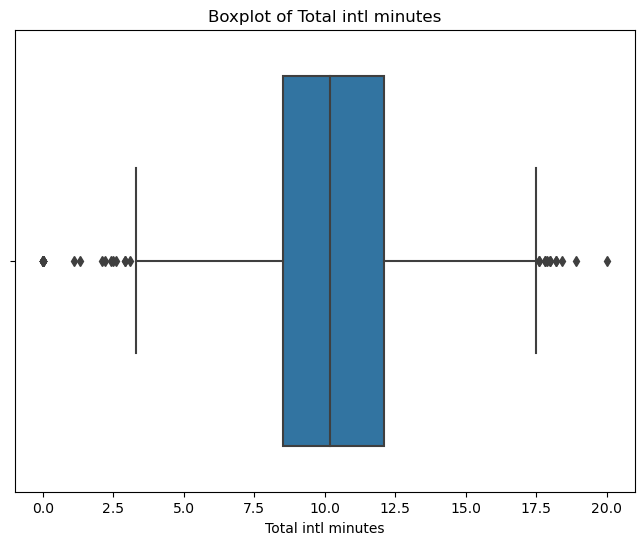

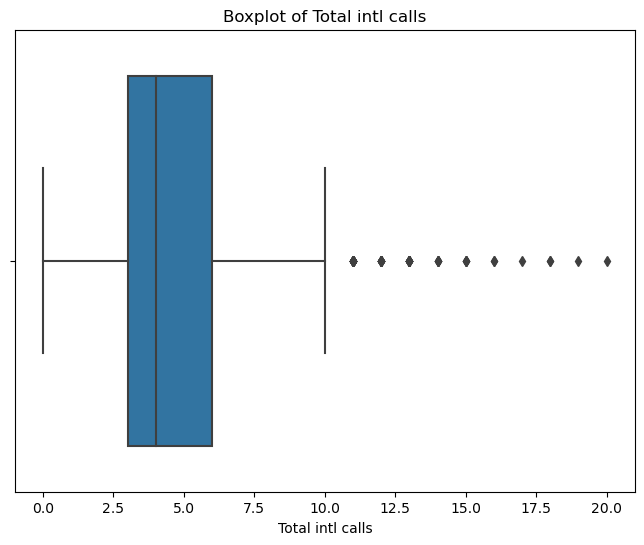

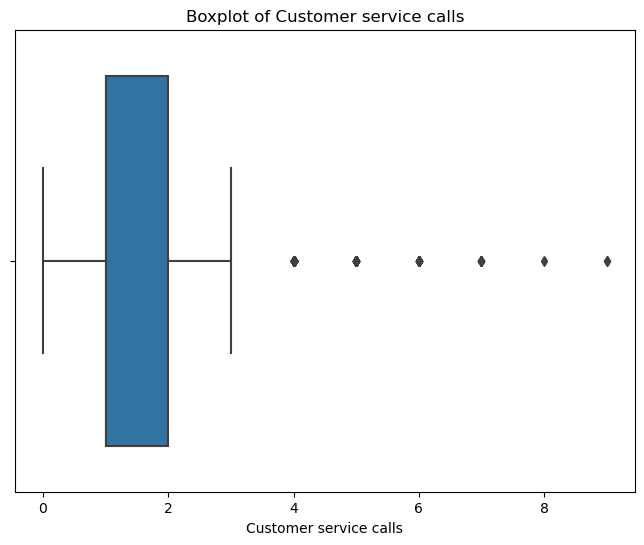

In [18]:
# Loop through each selected feature and create a boxplot
for feature in num_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=telcom[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()

We won't be removing or imputing any of the outliers as it seems that the data is realistic and not that extreme or insertion erros.
* We will keep them in order to avoid information loss.

* **Feature Engineering**

The duration of calls within day, eve, night and intl seems

In [19]:
#Ratio features
telcom['Avg day duration'] = telcom['Total day minutes'] / telcom['Total day calls']
telcom['Avg eve duration'] = telcom['Total eve minutes'] / telcom['Total eve calls']
telcom['Avg night duration'] = telcom['Total night minutes'] / telcom['Total night calls']
telcom['Avg intl duration'] = telcom['Total intl minutes'] / telcom['Total intl calls']

#Interaction features
telcom['Total minutes'] = telcom['Total day minutes'] + telcom['Total eve minutes'] + telcom['Total night minutes'] + telcom['Total intl minutes']
telcom['Total calls'] = telcom['Total day calls'] + telcom['Total eve calls'] + telcom['Total night calls'] + telcom['Total intl calls']

# Ratio features for telcom_test
telcom_test['Avg day duration'] = telcom_test['Total day minutes'] / telcom_test['Total day calls']
telcom_test['Avg eve duration'] = telcom_test['Total eve minutes'] / telcom_test['Total eve calls']
telcom_test['Avg night duration'] = telcom_test['Total night minutes'] / telcom_test['Total night calls']
telcom_test['Avg intl duration'] = telcom_test['Total intl minutes'] / telcom_test['Total intl calls']

# Interaction features for telcom_test
telcom_test['Total minutes'] = telcom_test['Total day minutes'] + telcom_test['Total eve minutes'] + telcom_test['Total night minutes'] + telcom_test['Total intl minutes']
telcom_test['Total calls'] = telcom_test['Total day calls'] + telcom_test['Total eve calls'] + telcom_test['Total night calls'] + telcom_test['Total intl calls']

In [20]:
# Handling division by zero (e.g., when calls = 0)
telcom['Avg day duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
telcom['Avg eve duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
telcom['Avg night duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
telcom['Avg intl duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)

# Handle division by zero for the test dataset
telcom_test['Avg day duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
telcom_test['Avg eve duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
telcom_test['Avg night duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
telcom_test['Avg intl duration'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)

We need to check whether the newly engineered features are multicolinear or not

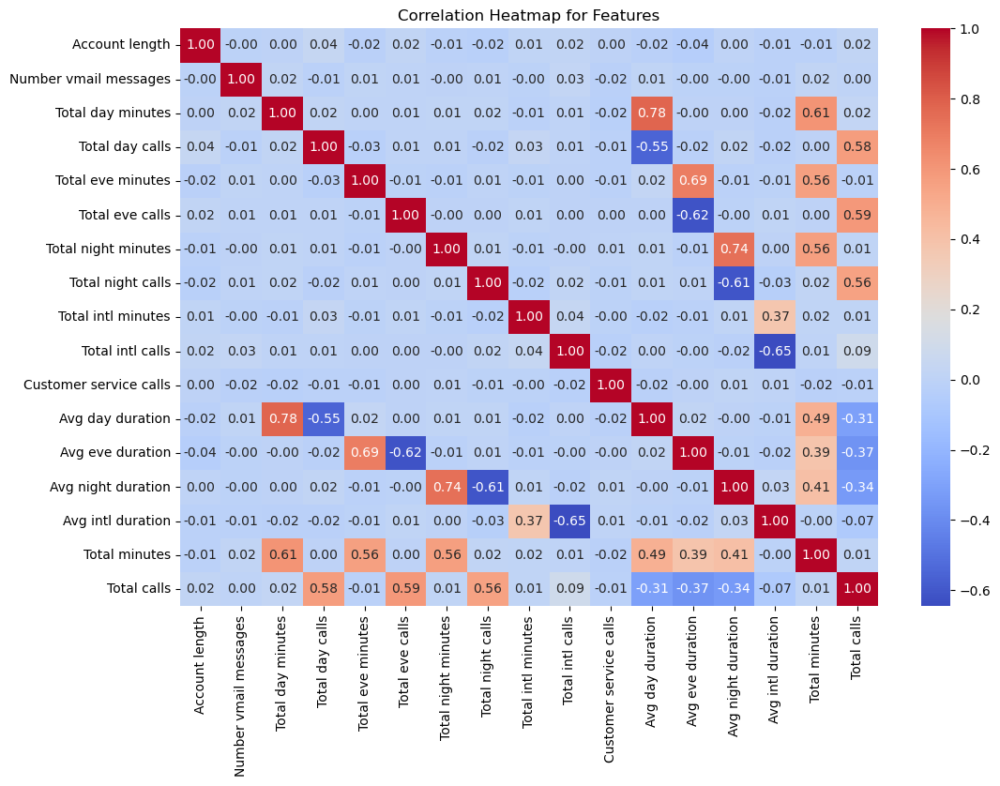

In [21]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
# Select only numeric columns from the DataFrame
numeric_telcom = telcom.select_dtypes(include=['number'])

# Compute the correlation matrix
correlation = numeric_telcom.corr()
sns.heatmap(correlation, annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Heatmap for Features")
plt.show()

In [22]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Add a constant column for the intercept
X = add_constant(numeric_telcom)

# Calculate the VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# View the VIF
print(vif_data)

                   Feature         VIF
0                    const  461.235879
1           Account length    1.004615
2    Number vmail messages    1.003016
3        Total day minutes         inf
4          Total day calls         inf
5        Total eve minutes         inf
6          Total eve calls         inf
7      Total night minutes         inf
8        Total night calls         inf
9       Total intl minutes         inf
10        Total intl calls         inf
11  Customer service calls    1.003211
12        Avg day duration   13.157657
13        Avg eve duration    6.724742
14      Avg night duration   14.725686
15       Avg intl duration    2.363984
16           Total minutes         inf
17             Total calls         inf


In [23]:
col_to_drop = ['Total minutes', 'Total calls']

telcom = telcom.drop(columns = col_to_drop, axis = 1)
telcom_test = telcom_test.drop(columns = col_to_drop, axis = 1)

In [24]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

numeric_telcom = telcom.select_dtypes(include=['number'])

# Add a constant column for the intercept
X = add_constant(numeric_telcom)

# Calculate the VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# View the VIF
print(vif_data)

                   Feature         VIF
0                    const  461.235879
1           Account length    1.004615
2    Number vmail messages    1.003016
3        Total day minutes    9.177994
4          Total day calls    5.186219
5        Total eve minutes    4.178928
6          Total eve calls    3.500641
7      Total night minutes    9.229620
8        Total night calls    6.671473
9       Total intl minutes    1.382032
10        Total intl calls    2.032608
11  Customer service calls    1.003211
12        Avg day duration   13.157657
13        Avg eve duration    6.724742
14      Avg night duration   14.725686
15       Avg intl duration    2.363984


In [25]:
col_to_drop = ['Avg day duration', 'Avg night duration', 'Avg eve duration']

telcom = telcom.drop(columns = col_to_drop, axis = 1)
telcom_test = telcom_test.drop(columns = col_to_drop, axis = 1)

In [26]:
telcom.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total eve minutes,Total eve calls,Total night minutes,Total night calls,Total intl minutes,Total intl calls,Customer service calls,Churn,Avg intl duration
0,128,No,Yes,25,265.1,110,197.4,99,244.7,91,10.0,3,1,False,3.333333
1,107,No,Yes,26,161.6,123,195.5,103,254.4,103,13.7,3,1,False,4.566667
2,137,No,No,0,243.4,114,121.2,110,162.6,104,12.2,5,0,False,2.440000
3,84,Yes,No,0,299.4,71,61.9,88,196.9,89,6.6,7,2,False,0.942857
4,75,Yes,No,0,166.7,113,148.3,122,186.9,121,10.1,3,3,False,3.366667


In [27]:
telcom_test.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total eve minutes,Total eve calls,Total night minutes,Total night calls,Total intl minutes,Total intl calls,Customer service calls,Churn,Avg intl duration
0,117,No,No,0,184.5,97,351.6,80,215.8,90,8.7,4,1,False,2.175000
1,65,No,No,0,129.1,137,228.5,83,208.8,111,12.7,6,4,True,2.116667
2,161,No,No,0,332.9,67,317.8,97,160.6,128,5.4,9,4,True,0.600000
3,111,No,No,0,110.4,103,137.3,102,189.6,105,7.7,6,2,False,1.283333
4,49,No,No,0,119.3,117,215.1,109,178.7,90,11.1,1,1,False,11.100000


* **Feature Encoding**

In [28]:
#Label encoding Binary columns
le = LabelEncoder()
for i in bin_cols:
    telcom[i] = le.fit_transform(telcom[i])
    telcom_test[i] = le.transform(telcom_test[i])

* **Correlation matrix**

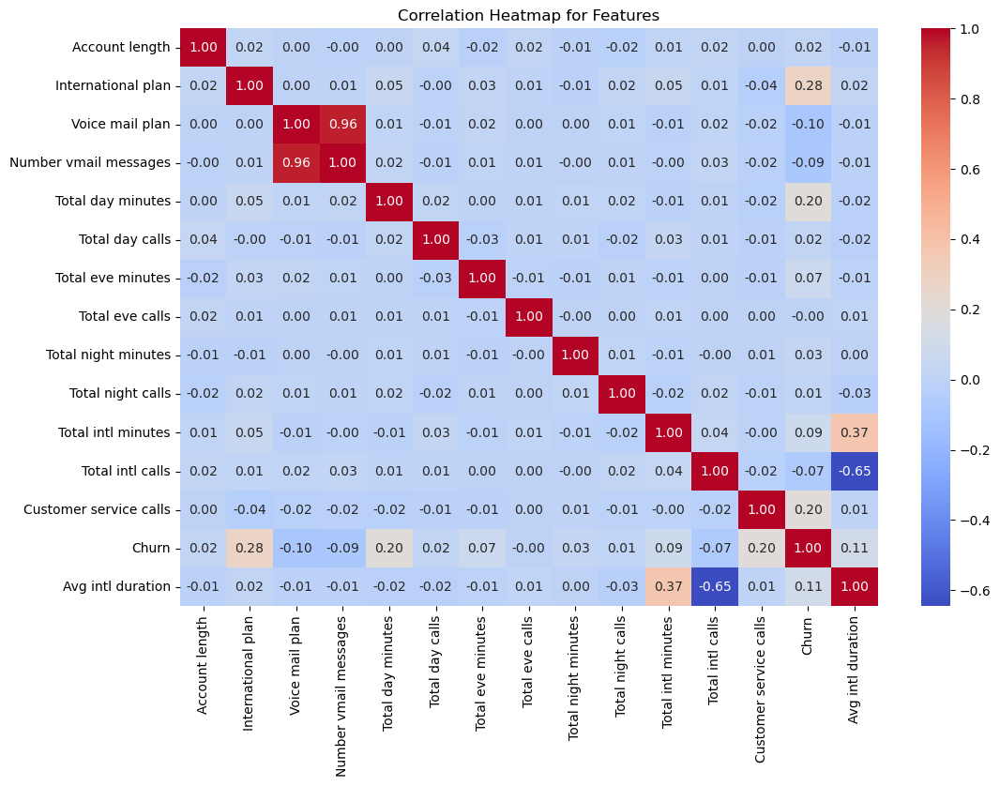

In [29]:
# Correlation heatmap
plt.figure(figsize=(12, 8))

# Compute the correlation matrix
sns.heatmap(telcom.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Heatmap for Features")
plt.show()

Voice mail plan and Number vmail messages are multicolinear with each other and since voice mail plan has a higher relationship with churn (-0.10) compared to number of vmail messages and churn (-0.09) we will drop number of vmail messages.
We can interpret according to the correlation coefficient that :
* A customer is more likely to churn with an international plan and high total eve minutes, total intl minutes, avg intl duration and number of customer service calls (positive coeff)
* A customer is more likely to churn  without a voice mail plan

In [30]:
telcom = telcom.drop(columns = 'Number vmail messages', axis = 1)
telcom_test = telcom_test.drop(columns = 'Number vmail messages', axis = 1)

In [31]:
cols_to_scale = ['International plan','Voice mail plan', 'Avg intl duration', 'Account length', 
                 'Total day minutes', 'Total day calls', 'Total eve minutes', 'Total eve calls', 
                 'Total night minutes', 'Total night calls',  'Total intl minutes', 'Total intl calls', 
                 'Customer service calls']

#combining the train and test datasets
trainsize = telcom.shape[0]
comb = pd.concat((telcom, telcom_test), sort=False)


#Separating the train and test datasets
telcom = comb[:trainsize]
telcom_test = comb[trainsize:]

#Scaling Numerical columns
std = StandardScaler()
scaled = std.fit_transform(telcom[cols_to_scale])
scaled = pd.DataFrame(scaled, columns=cols_to_scale)

scaled_test = std.transform(telcom_test[cols_to_scale])
scaled_test = pd.DataFrame(scaled_test, columns=cols_to_scale)

#dropping original values merging scaled values for numerical columns
df_telcom_og = telcom.copy()
telcom = telcom.drop(columns = cols_to_scale, axis = 1)
telcom = telcom.merge(scaled, left_index=True, right_index=True, how = "left")

df_telcom_test_og = telcom_test.copy()
telcom_test = telcom_test.drop(columns = cols_to_scale, axis = 1)
telcom_test = telcom_test.merge(scaled_test, left_index=True, right_index=True, how = "left")

* **Visualizing data with principal components**

In [32]:
def pca_scatter(pcadf, targetfeature, targetlabel, color):
    tracer = go.Scatter(x = pcadf[pcadf[targetfeature]==targetlabel]["PC1"],
                        y = pcadf[pcadf[targetfeature]==targetlabel]["PC2"],
                        name = targetlabel, mode = "markers",
                        marker = dict(color = color, line = dict(width = .5), symbol = "diamond-open"),
                       )
    return tracer

In [33]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)

X = telcom[[i for i in telcom.columns if i not in target_col]]
Y = telcom[target_col]

principal_components = pca.fit_transform(X)
pca_data = pd.DataFrame(principal_components, columns = ["PC1", "PC2"])
pca_data = pca_data.merge(Y, left_index=True, right_index=True, how="left")
pca_data["Churn"] = pca_data["Churn"].replace({1: "Churn", 0: "Not churn"})
layout = go.Layout(dict(title = "Visualizing data with PCA",
                        plot_bgcolor = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "first principal component (PC1)",
                                     zerolinewidth=1, ticklen=5, gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "second principal component (PC2)",
                                     zerolinewidth=1, ticklen=5, gridwidth=2),
                        height = 400
                       )
                  )
trace1 = pca_scatter(pca_data, 'Churn', 'Churn', 'red')
trace2 = pca_scatter(pca_data, 'Churn', 'Not churn', 'royalblue')
data = [trace2, trace1]
fig = go.Figure(data=data, layout=layout)
fig.show()

# **5. Model Building**


---



Since our target variable *Churn* is categorical (Churn or No Churn) we will have recourse to supervise machine learning techniques as it is more appropriate than its unsupervised alternatives.

In [34]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, cohen_kappa_score
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score

import statsmodels.api as sm

#defining the studied or used independent features (columns) as well the target
cols = [i for i in telcom.columns if i not in target_col]
target_col = ['Churn']

#splitting the principal training dataset to subtrain and subtest datasets
x_train, x_test, y_train, y_test = train_test_split(telcom[cols], telcom[target_col],
                                                    test_size = 0.2, random_state = 0)

#splitting the no scaled principal training dataset to subtrain and subtest datasets
x_train_og, x_test_og, y_train_og, y_test_og = train_test_split(df_telcom_og[cols], telcom[target_col],
                                                                test_size = 0.2, random_state = 0)

5.1.   **Logistic Regression**


* Create and train Logistic Regression

In [35]:
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.linear_model import LogisticRegression

# Create a list of regularization parameter values
C_values = [0.001, 0.01, 0.1, 1, 10, 100]

# Create an empty dictionary to store the results
results = {}

# Train Logistic Regression models with different C values
for C in C_values:
    lr_model = make_pipeline(
    StandardScaler(),
    LogisticRegression(C=C, max_iter=1000)
    )
    lr_model.fit(x_train, y_train)
    y_pred_lr = lr_model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred_lr)
    results[C] = {
        'model': lr_model,
        'accuracy': accuracy
    }


In [36]:
# Print the results of the classification
print("Results of Logistic Regression Classification:")
for C, result in results.items():
    print(f"C = {C}, Accuracy: {result['accuracy']:.4f}")


Results of Logistic Regression Classification:
C = 0.001, Accuracy: 0.8708
C = 0.01, Accuracy: 0.8764
C = 0.1, Accuracy: 0.8689
C = 1, Accuracy: 0.8652
C = 10, Accuracy: 0.8652
C = 100, Accuracy: 0.8652


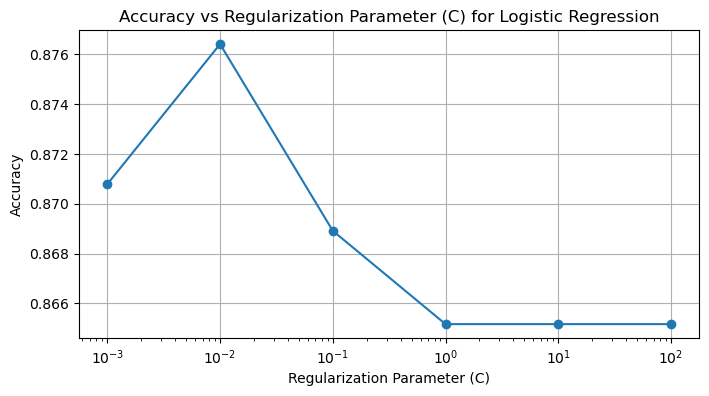

In [37]:
# Visualize the accuracy vs regularization parameter (C)
accuracies = [result['accuracy'] for C, result in results.items()]

plt.figure(figsize=(8, 4))
plt.plot(C_values, accuracies, marker='o')
plt.xscale('log')
plt.xlabel('Regularization Parameter (C)')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Regularization Parameter (C) for Logistic Regression')
plt.grid(True)
plt.show()

We reach our best accuracy with C=0.01 according to this baseline model using logistic regression

* GridSearchCV for best Hyperparameter selection

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best C Hyperparameter : 1
Best CV Precision : 0.3304188358292677

Confusion Matrix:
[[452  13]
 [ 59  10]]

Classification Report :
              precision    recall  f1-score   support

           0       0.88      0.97      0.93       465
           1       0.43      0.14      0.22        69

    accuracy                           0.87       534
   macro avg       0.66      0.56      0.57       534
weighted avg       0.83      0.87      0.83       534


ROC AUC Score: 0.830450366214742


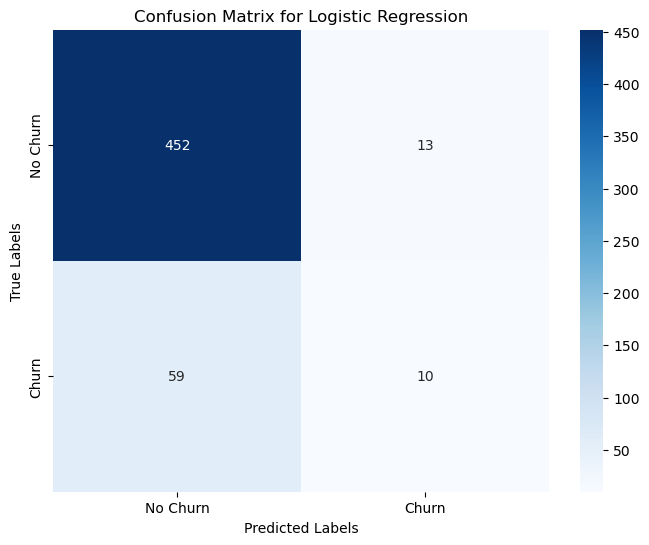

In [38]:
from sklearn.model_selection import GridSearchCV

# Pipeline definition
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(max_iter=1000))
])

# C values to test
param_grid = {
    'logreg__C': [0.001, 0.01, 0.1, 1, 10, 100]
}

# Configuration de GridSearchCV
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=5,  # 5 folds
    scoring='f1',  # The goal is to optimize f1-score
    verbose=2,
    n_jobs=-1
)

# Search for the best hyperparameters
grid_search.fit(x_train, y_train)

# Affichage des résultats
print("Best C Hyperparameter :", grid_search.best_params_['logreg__C'])
print("Best CV Precision :", grid_search.best_score_)

# Évaluation sur l'ensemble de test
best_model = grid_search.best_estimator_
y_pred_lr = best_model.predict(x_test)
y_pred_proba_lr = best_model.predict_proba(x_test)[:, 1]

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_lr))
print("\nClassification Report :")
print(classification_report(y_test, y_pred_lr))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_proba_lr))

# Plotting the Confusion Matrix
cm = confusion_matrix(y_test, y_pred_lr)

# Set up the matplotlib figure
plt.figure(figsize=(8, 6))

# Plot the heatmap for the confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for Logistic Regression')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

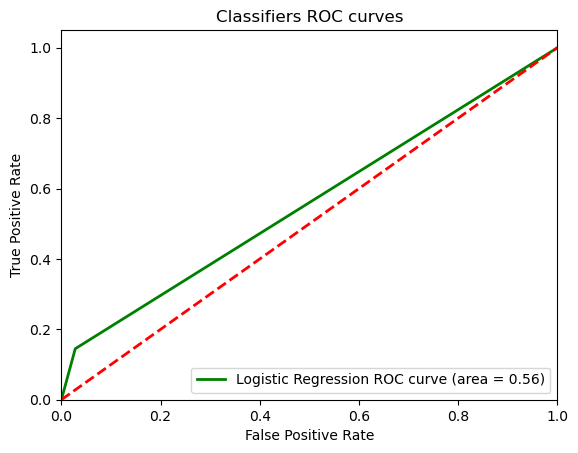

In [39]:
from sklearn.metrics import auc

# Calculate the false positive rate and true positive rate
fpr_lr, tpr_lr, threshold_lr = roc_curve(y_test, y_pred_lr)
roc_auc_lr = auc(fpr_lr, tpr_lr)

plt.figure()

plt.plot(fpr_lr, tpr_lr, color='green', lw=2, label='Logistic Regression ROC curve (area = %0.2f)'% roc_auc_lr)

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

* The model has high accuracy (87%), but this is largely driven by the correct classification of the majority class (No Churn).
* Recall for Churn (0.14) is quite low, meaning the model is missing a lot of actual "Churn" cases (59 false negatives).
* Precision for Churn (0.43) is also not great, indicating that when the model does predict "Churn," it’s not very confident, and many of those predictions are incorrect (15 false positives).
* Roc Curve (area =0.56) is quite low signifying a poor test

**Thus, we will use Synthetic Minority Oversampling TEchnique (SMOTE)** : It can help by generating synthetic examples of the minority class (Churn) to improve the model's ability to recognize it.


In [40]:
from imblearn.over_sampling import SMOTE

#oversampling minority class using smote
smote = SMOTE(random_state = 0)
x_smote, y_smote = smote.fit_resample(x_train, y_train)
x_smote = pd.DataFrame(data = x_smote, columns=cols)
y_smote = pd.DataFrame(data = y_smote, columns=target_col)

* Logistic Regression using SMOTE resamples

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best C Hyperparameter : 0.1
Best CV Precision : 0.7588083397469617

Confusion Matrix:
[[358 107]
 [ 17  52]]

Classification Report :
              precision    recall  f1-score   support

           0       0.95      0.77      0.85       465
           1       0.33      0.75      0.46        69

    accuracy                           0.77       534
   macro avg       0.64      0.76      0.65       534
weighted avg       0.87      0.77      0.80       534


ROC AUC Score: 0.8250584385226741


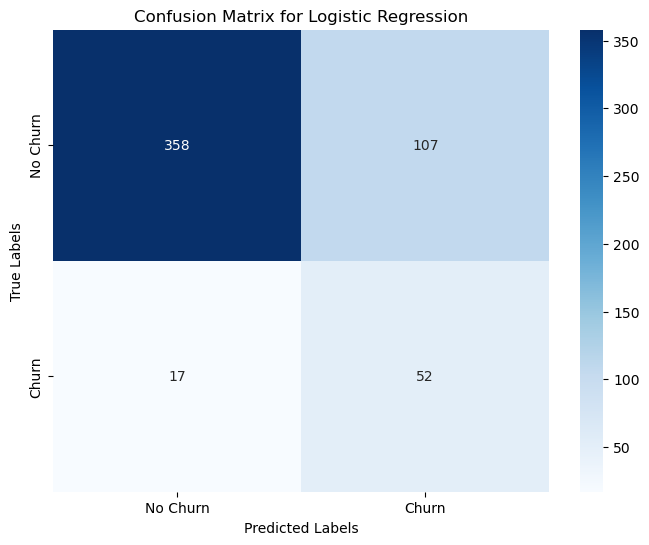

In [41]:
from sklearn.model_selection import GridSearchCV

# Pipeline definition
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(max_iter=1000))
])

# C values to test
param_grid = {
    'logreg__C': [0.001, 0.01, 0.1, 1, 10, 100]
}

# Configuration de GridSearchCV
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=5,  # 5 folds
    scoring='f1',  # The goal is to optimize F1-score
    verbose=2,
    n_jobs=-1
)

# Search for the best hyperparameters
grid_search.fit(x_smote, y_smote)

# Affichage des résultats
print("Best C Hyperparameter :", grid_search.best_params_['logreg__C'])
print("Best CV Precision :", grid_search.best_score_)

# Évaluation sur l'ensemble de test
best_model = grid_search.best_estimator_
y_pred_lr_smote = best_model.predict(x_test)
y_pred_proba_lr_smote = best_model.predict_proba(x_test)[:, 1]

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_lr_smote))
print("\nClassification Report :")
print(classification_report(y_test, y_pred_lr_smote))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_proba_lr_smote))

# Plotting the Confusion Matrix
cm = confusion_matrix(y_test, y_pred_lr_smote)

# Set up the matplotlib figure
plt.figure(figsize=(8, 6))

# Plot the heatmap for the confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for Logistic Regression')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

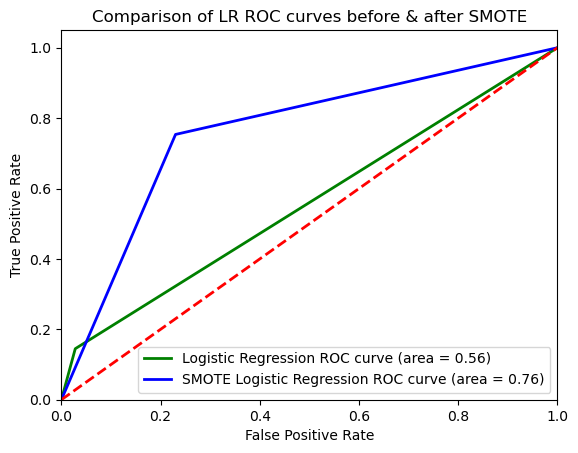

In [42]:
from sklearn.metrics import auc

# Calculate the false positive rate and true positive rate
fpr_lr_smote, tpr_lr_smote, threshold_lr_smote = roc_curve(y_test, y_pred_lr_smote)
roc_auc_lr_smote = auc(fpr_lr_smote, tpr_lr_smote)

plt.figure()

plt.plot(fpr_lr, tpr_lr, color='green', lw=2, label='Logistic Regression ROC curve (area = %0.2f)'% roc_auc_lr)
plt.plot(fpr_lr_smote, tpr_lr_smote, color='blue', lw=2, label='SMOTE Logistic Regression ROC curve (area = %0.2f)'% roc_auc_lr_smote)

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Comparison of LR ROC curves before & after SMOTE')
plt.legend(loc = "lower right")
plt.show()

* The model has lower accuracy (74%) with smote reflecting better performance as it was insignificant earlier with our imbalanced dataset.
* However, recall for Churn (0.75) is much higher, meaning the model is predicting a lot of actual "Churn" cases (52 true negatives).
* Precision for Churn (0.33) is lower, indicating that the model does predict "Churn," but many of those predictions are incorrect (17 false negatives).
* AUC = 0.76 improved considerably after SMOTE but is still not optimal.

5.2. **K-Nearest Neighbor (kNN)**

Text(0, 0.5, 'Error')

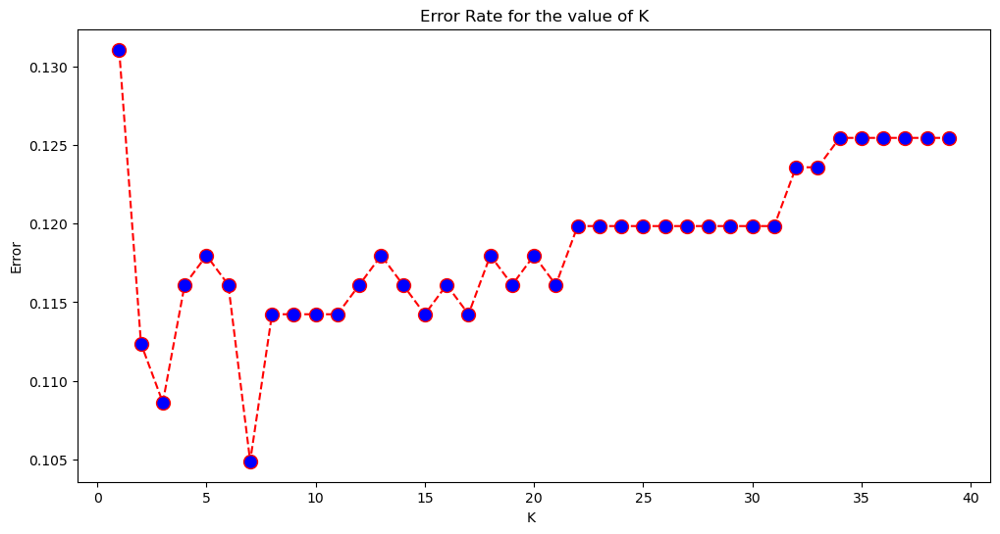

In [43]:
from sklearn.neighbors import KNeighborsClassifier

error = []
# For each iteration, the average error for the predicted values of the test set is calculated and saved in the Error list.
# Test k from 1 to 40 and Manhattan distance
for i in range(1, 40):
    knn = KNeighborsClassifier(i,metric='manhattan')
    knn_model = knn.fit(x_train, y_train)
    pred_i = knn_model.predict(x_test)
    error.append(np.mean(pred_i != y_test['Churn'].values))
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate for the value of K')
plt.xlabel('K ')
plt.ylabel('Error')

We want to choose the most adequate K for n_neighbors graphically. It's better to choose a number in the middle of the range to avoid both overfitting and underfitting. The error rate stabilizes from 8 onwards and since for k = 7 the error is minimal, we choose for k = 7. As a rule of thumb we have K < sqrt(n) : sqrt(543) ~ 23. Let's check numerically.

* **GridSearchCV for best Hyperparameters**

In [44]:
from sklearn.model_selection import GridSearchCV

n_neighbors = list(range(1,90))
# p=1 manhattan_distance (can be used for categorical values)/
# p=2 euclidean_distance(cannot be used for categorical values)
p=[1,2]
# Convert to dictionary
hyperparameters = dict(n_neighbors=n_neighbors, p=p)
# Create new KNN object
knn_2 = KNeighborsClassifier()
# Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters, cv=5, verbose=2,
    n_jobs=-1)

# cv: number of folds of the cross validation

# Fit the model
best_model = clf.fit(x_train, y_train)
# Print The value of best Hyperparameters
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

Fitting 5 folds for each of 178 candidates, totalling 890 fits
Best p: 1
Best n_neighbors: 5


According to GridSearchCV the best hyperparameters for our models are Manhattan distance and K=5. K=5 is quite low and might cause overfitting but since we have classe instability between Churn and No Churn a lower K is preferrable.
* However we will check with SMOTE later on.

0.8878967795846116
Accuracy of K-NN classifier on training set: 0.92
Accuracy of K-NN classifier on test set: 0.88

ROC AUC Score: 0.5866760168302945
[[458   7]
 [ 56  13]]
              precision    recall  f1-score   support

           0       0.89      0.98      0.94       465
           1       0.65      0.19      0.29        69

    accuracy                           0.88       534
   macro avg       0.77      0.59      0.61       534
weighted avg       0.86      0.88      0.85       534



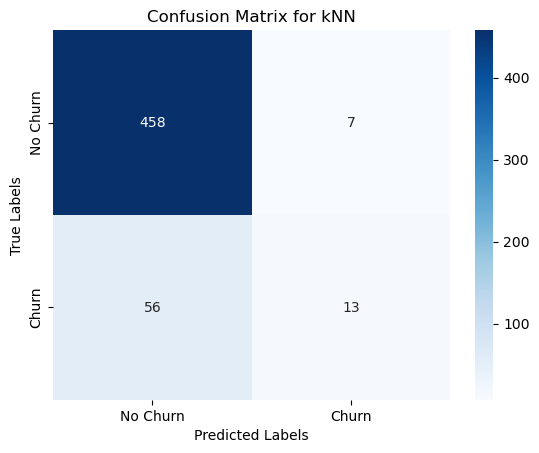

In [45]:
# Evaluate the model
best_result = clf.best_score_   #accuracy
print(best_result)

# Test the model on test dataset
knn = KNeighborsClassifier(5,p=1)
knn_model = knn.fit(x_train, y_train)
y_pred_knn = knn_model.predict(x_test)

print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(x_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_knn))

# Display confusion matrix
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred_knn))

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_knn))
#weighted avg : weighted average by data size

# Plotting the Confusion Matrix
cm_knn = confusion_matrix(y_test, y_pred_knn)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for kNN')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

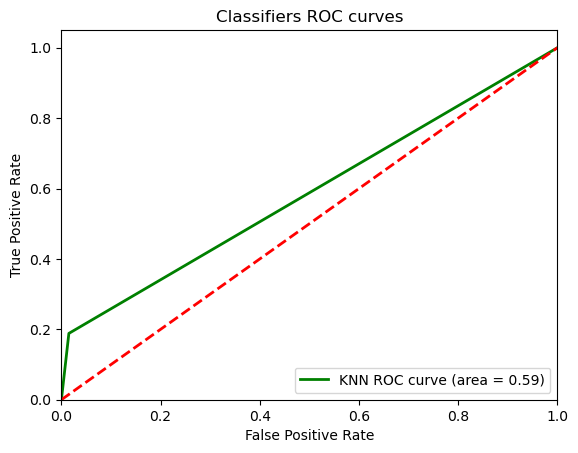

In [46]:
from sklearn.metrics import auc

# Calculate the false positive rate and true positive rate
fpr_knn, tpr_knn, threshold_knn = roc_curve(y_test, y_pred_knn)
roc_auc_knn = auc(fpr_knn, tpr_knn)

plt.figure()

plt.plot(fpr_knn, tpr_knn, color='green', lw=2, label='KNN ROC curve (area = %0.2f)'% roc_auc_knn)

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

* The model has high accuracy (88%), but this is largely driven by the correct classification of the majority class (No Churn).
* Recall for Churn (0.19) is quite low, meaning the model is missing a lot of actual "Churn" cases (56 false negatives).
* Precision for Churn (0.65) is okay but not optimal, indicating that when the model does predict "Churn," it’s not very confident, quite of few of those predictions are incorrect (13 false positives).
* Roc Curve (area =0.59) is quite low signifying a poor test

* **KNN Modeling using SMOTE**

*GridSearchCV for best Hyperparameters*

In [47]:
from sklearn.model_selection import GridSearchCV

n_neighbors = list(range(1,90))
# p=1 manhattan_distance (can be used for categorical values)/
# p=2 euclidean_distance(cannot be used for categorical values)
p=[1,2]
# Convert to dictionary
hyperparameters = dict(n_neighbors=n_neighbors, p=p)
# Create new KNN object
knn_2 = KNeighborsClassifier()
# Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters, cv=5, verbose=2,
    n_jobs=-1)

# cv: number of folds of the cross validation

# Fit the model
best_model = clf.fit(x_smote, y_smote)
# Print The value of best Hyperparameters
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

Fitting 5 folds for each of 178 candidates, totalling 890 fits
Best p: 1
Best n_neighbors: 2


*Testing with the best hyperparameters*


0.9531163674361167
Accuracy of K-NN classifier on training set: 0.94
Accuracy of K-NN classifier on test set: 0.81

ROC AUC Score: 0.7719962599345489
[[381  84]
 [ 19  50]]
              precision    recall  f1-score   support

           0       0.95      0.82      0.88       465
           1       0.37      0.72      0.49        69

    accuracy                           0.81       534
   macro avg       0.66      0.77      0.69       534
weighted avg       0.88      0.81      0.83       534



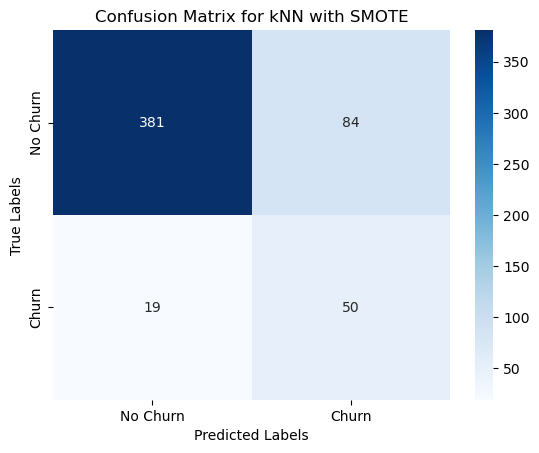

In [48]:
# Evaluate the model
best_result = clf.best_score_   #accuracy
print(best_result)

# Test the model on test dataset
knn_smote = KNeighborsClassifier(2,p=1)
knn_smote = knn.fit(x_smote, y_smote)
y_pred_knn_smote = knn_smote.predict(x_test)

print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn_smote.score(x_smote, y_smote)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn_smote.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_knn_smote))

# Display confusion matrix
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred_knn_smote))

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_knn_smote))
#weighted avg : weighted average by data size

# Plotting the Confusion Matrix
cm_knn_smote = confusion_matrix(y_test, y_pred_knn_smote)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_knn_smote, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for kNN with SMOTE')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

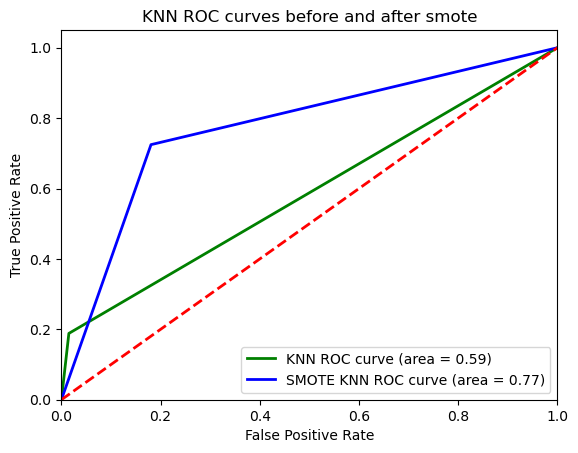

In [49]:
from sklearn.metrics import auc

# Calculate the false positive rate and true positive rate
fpr_knn_smote, tpr_knn_smote, threshold_knn_smote = roc_curve(y_test, y_pred_knn_smote)
roc_auc_knn_smote = auc(fpr_knn_smote, tpr_knn_smote)

plt.figure()

plt.plot(fpr_knn, tpr_knn, color='green', lw=2, label='KNN ROC curve (area = %0.2f)'% roc_auc_knn)
plt.plot(fpr_knn_smote, tpr_knn_smote, color='blue', lw=2, label='SMOTE KNN ROC curve (area = %0.2f)'% roc_auc_knn_smote)

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('KNN ROC curves before and after smote')
plt.legend(loc = "lower right")
plt.show()

* The model has lower accuracy (81%) with smote reflecting better performance as it was insignificant earlier with our imbalanced dataset but it's great considering.
* However, recall for Churn (0.72) is higher, meaning the model is losing less actual "Churn" cases (50 true negatives).
* Precision for Churn (0.37) is lower, indicating that the model does predict "Churn," but many of those predictions are incorrect (19 FN).
* AUC = 0.77 improved considerably after SMOTE but it's still not strong.
* KNN is *NOT* optimal.

5.3 **Support Vector Machine (SVM)**

* Gaussian RBF Kernel

In [50]:
from sklearn.svm import SVC

svm = SVC(kernel="rbf", class_weight="balanced")
svm.fit(x_train, y_train)
from sklearn.metrics import classification_report
y_pred_svc_1 = svm.predict(x_test)
print(classification_report(y_pred_svc_1, y_test))

              precision    recall  f1-score   support

           0       0.92      0.95      0.94       451
           1       0.68      0.57      0.62        83

    accuracy                           0.89       534
   macro avg       0.80      0.76      0.78       534
weighted avg       0.89      0.89      0.89       534



* Linear Kernel

In [51]:
svm = SVC(kernel="linear", class_weight="balanced")
svm.fit(x_train, y_train)
y_pred_svc_2 = svm.predict(x_test)
print(classification_report(y_pred_svc_2, y_test))

              precision    recall  f1-score   support

           0       0.74      0.96      0.84       361
           1       0.78      0.31      0.45       173

    accuracy                           0.75       534
   macro avg       0.76      0.64      0.64       534
weighted avg       0.76      0.75      0.71       534



* Polynomial Kernel

In [52]:
svm = SVC(kernel="poly", class_weight="balanced")
svm.fit(x_train, y_train)
from sklearn.metrics import classification_report
y_pred_svc_3 = svm.predict(x_test)
print(classification_report(y_pred_svc_3, y_test))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93       457
           1       0.62      0.56      0.59        77

    accuracy                           0.89       534
   macro avg       0.78      0.75      0.76       534
weighted avg       0.88      0.89      0.89       534



* Sigmoid Kernel

In [53]:
svm = SVC(kernel="sigmoid", class_weight="balanced")
svm.fit(x_train, y_train)
from sklearn.metrics import classification_report
y_pred_svc_4 = svm.predict(x_test)
print(classification_report(y_pred_svc_4, y_test))

              precision    recall  f1-score   support

           0       0.58      0.91      0.70       296
           1       0.59      0.17      0.27       238

    accuracy                           0.58       534
   macro avg       0.59      0.54      0.49       534
weighted avg       0.58      0.58      0.51       534



* Compare all SVM Kernels

In [54]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

s1=accuracy_score(y_test, y_pred_svc_1)
s2=accuracy_score(y_test, y_pred_svc_2)
s3=accuracy_score(y_test, y_pred_svc_3)
s4=accuracy_score(y_test, y_pred_svc_4)

models = pd.DataFrame({
    'Model': ['Support Vector Machines RBF', 'Support Vector Machines Linear','Support Vector Machines polynomial',
              'Support Vector Machines sigmoïd'],
    'Score': [s1,s2, s3,
              s4]})
models.sort_values(by="Score",ascending=False)

,Model,Score
0,Support Vector Machines RBF,0.891386
2,Support Vector Machines polynomial,0.887640
1,Support Vector Machines Linear,0.749064
3,Support Vector Machines sigmoïd,0.578652


* The RBF kernel achieves the highest score (0.89) closely followed by Polynomial (0.88), indicating it is the best fit for our data among the tested kernels.
* We can interpret that our data has a non-linear structure with interactions between features that the RBF and polynomial kernels can effectively capture.

* ROC Curve comparison

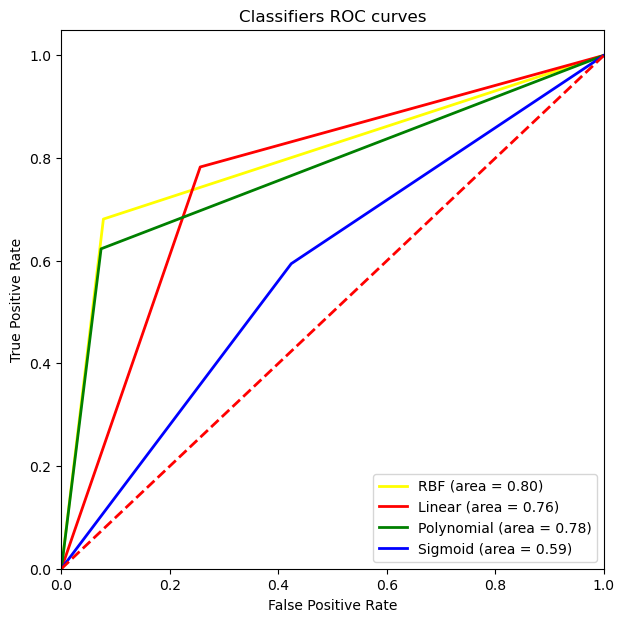

In [55]:
from sklearn.metrics import roc_curve, auc
fpr1, tpr1, threshold1 = roc_curve(y_test, y_pred_svc_1)
roc_auc1 = auc(fpr1, tpr1)
fpr2, tpr2, threshold2 = roc_curve(y_test, y_pred_svc_2)
roc_auc2 = auc(fpr2, tpr2)
fpr3, tpr3, threshold3 = roc_curve(y_test, y_pred_svc_3)
roc_auc3 = auc(fpr3, tpr3)
fpr4, tpr4, threshold4 = roc_curve(y_test, y_pred_svc_4)
roc_auc4 = auc(fpr4, tpr4)
plt.figure(figsize=(7,7))
plt.plot(fpr1, tpr1, color='yellow', lw=2, label='RBF (area = %0.2f)'% roc_auc1)
plt.plot(fpr2, tpr2, color='red', lw=2, label='Linear (area = %0.2f)'% roc_auc2)
plt.plot(fpr3, tpr3, color='green', lw=2, label='Polynomial (area = %0.2f)'% roc_auc3)
plt.plot(fpr4, tpr4, color='blue', lw=2, label='Sigmoid (area = %0.2f)'% roc_auc4)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

* RBF has better AUC (0.80 > 0.78) meaning it balances performance between Churn and No Churn better.
* In our case, RBF is more robust against class imbalance which is a problem in our case so we favor RBF to Polynomial

* GridSearchCV for best hyperparameters

*We won't include sigmoid in our GridSearchCV since it performs poorly compared to the others*

In [56]:
from sklearn.model_selection import GridSearchCV

# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'kernel': ['rbf','poly', 'linear']}

grid = GridSearchCV(SVC(), param_grid, refit = True, cv=5, verbose=2,
    n_jobs=-1)

# fitting the model for grid search
grid.fit(x_train, y_train)

# best parameters and score
print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best Parameters: {'C': 10, 'kernel': 'rbf'}
Best Score: 0.9240217259843211


*Let's model with Gaussian RBF Kernel using C=10 and balanced method*

Accuracy of svm classifier on training set: 0.99
Accuracy of svm classifier on test set: 0.91

ROC AUC Score: 0.7549322113136979
[[446  19]
 [ 31  38]]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       465
           1       0.67      0.55      0.60        69

    accuracy                           0.91       534
   macro avg       0.80      0.75      0.78       534
weighted avg       0.90      0.91      0.90       534



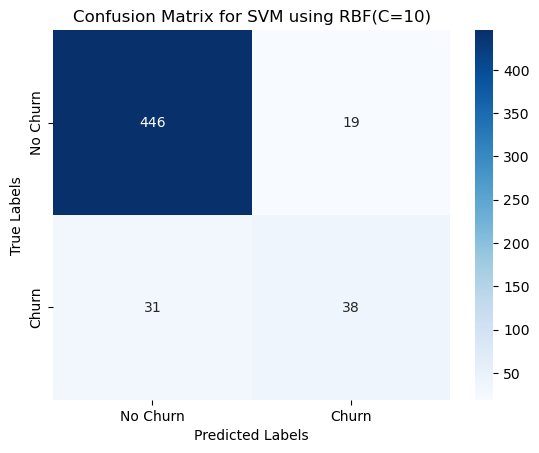

In [57]:
svm = SVC(C=10,kernel="rbf", class_weight="balanced")
svm.fit(x_train, y_train)

y_pred_svm = svm.predict(x_test)

print('Accuracy of svm classifier on training set: {:.2f}'
     .format(svm.score(x_train, y_train)))
print('Accuracy of svm classifier on test set: {:.2f}'
     .format(svm.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_svm))

# Display confusion matrix
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred_svm))

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_svm))
#weighted avg : weighted average by data size

# Plotting the Confusion Matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for SVM using RBF(C=10)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

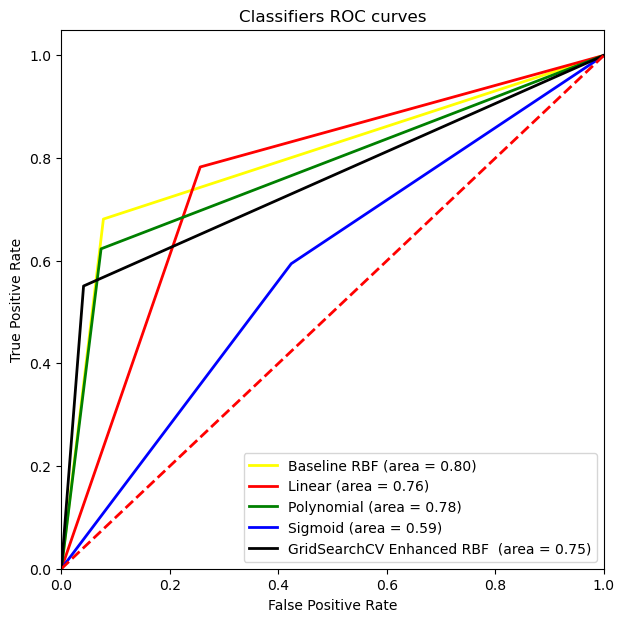

In [58]:
fpr_svm, tpr_svm, threshold_svm = roc_curve(y_test, y_pred_svm)
roc_auc_svm = auc(fpr_svm, tpr_svm)
plt.figure(figsize=(7,7))
plt.plot(fpr1, tpr1, color='yellow', lw=2, label='Baseline RBF (area = %0.2f)'% roc_auc1)
plt.plot(fpr2, tpr2, color='red', lw=2, label='Linear (area = %0.2f)'% roc_auc2)
plt.plot(fpr3, tpr3, color='green', lw=2, label='Polynomial (area = %0.2f)'% roc_auc3)
plt.plot(fpr4, tpr4, color='blue', lw=2, label='Sigmoid (area = %0.2f)'% roc_auc4)
plt.plot(fpr_svm, tpr_svm, color='black', lw=2, label='GridSearchCV Enhanced RBF  (area = %0.2f)'% roc_auc_svm)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

A high C value (C=10 in our case) means that the model prioritized fitting the training data more closely, which actually led to a hint of overfitting, leading consequently to lower AUC.

5.4 **Decision Tree**

* Creation of a decision tree with a list of hyperparameters

In [59]:
from sklearn.tree import DecisionTreeClassifier

# Create a list of splitting criteria
splitting_criteria = ['entropy', 'gini']

# Create a list of max depth values
max_depth_values = range(1, 20, 2)

# Create an empty dictionary to store the results
results = {}

# Train Decision Tree models with different splitting criteria and max depth
for criterion in splitting_criteria:
    for max_depth in max_depth_values:
        dt_model = DecisionTreeClassifier(criterion=criterion, max_depth=max_depth)
        dt_model.fit(x_train, y_train)
        y_pred_dt = dt_model.predict(x_test)
        accuracy = accuracy_score(y_test, y_pred_dt)
        results[(criterion, max_depth)] = {
            'model': dt_model,
            'accuracy': accuracy
        }

# Print the results of the classification
print("Results of Decision Tree Classification:")
for (criterion, max_depth), result in results.items():
    print(f"Criterion: {criterion}, Max Depth: {max_depth}, Accuracy: {result['accuracy']:.2f}")

Results of Decision Tree Classification:
Criterion: entropy, Max Depth: 1, Accuracy: 0.87
Criterion: entropy, Max Depth: 3, Accuracy: 0.90
Criterion: entropy, Max Depth: 5, Accuracy: 0.93
Criterion: entropy, Max Depth: 7, Accuracy: 0.94
Criterion: entropy, Max Depth: 9, Accuracy: 0.95
Criterion: entropy, Max Depth: 11, Accuracy: 0.94
Criterion: entropy, Max Depth: 13, Accuracy: 0.94
Criterion: entropy, Max Depth: 15, Accuracy: 0.93
Criterion: entropy, Max Depth: 17, Accuracy: 0.92
Criterion: entropy, Max Depth: 19, Accuracy: 0.92
Criterion: gini, Max Depth: 1, Accuracy: 0.87
Criterion: gini, Max Depth: 3, Accuracy: 0.90
Criterion: gini, Max Depth: 5, Accuracy: 0.93
Criterion: gini, Max Depth: 7, Accuracy: 0.94
Criterion: gini, Max Depth: 9, Accuracy: 0.93
Criterion: gini, Max Depth: 11, Accuracy: 0.92
Criterion: gini, Max Depth: 13, Accuracy: 0.91
Criterion: gini, Max Depth: 15, Accuracy: 0.90
Criterion: gini, Max Depth: 17, Accuracy: 0.91
Criterion: gini, Max Depth: 19, Accuracy: 0.91

We get the highest accuracy (0.95) with either Entropy and Max Depth = 9 

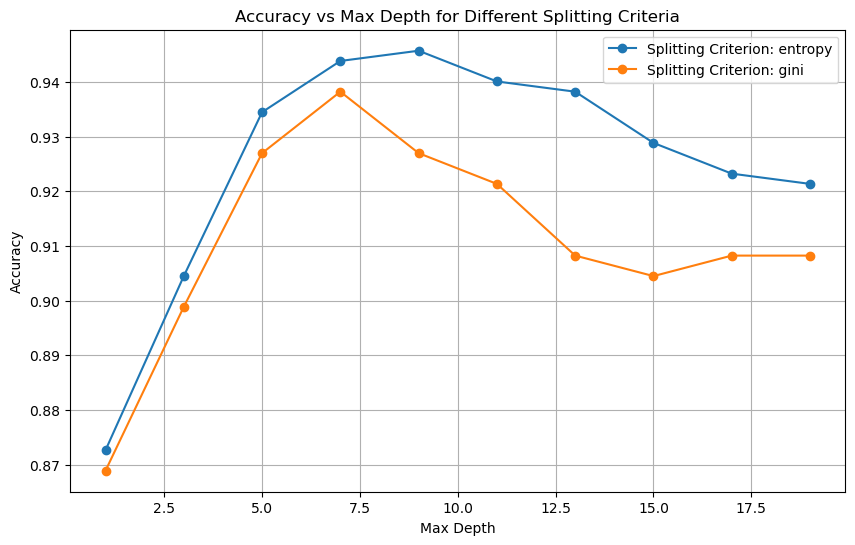

In [61]:
# Visualize the accuracy vs max depth for each splitting criterion
plt.figure(figsize=(10, 6))
for criterion in splitting_criteria:
    accuracies = [result['accuracy'] for (c, md), result in results.items() if c == criterion]
    plt.plot(max_depth_values, accuracies, marker='o', label=f'Splitting Criterion: {criterion}')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Max Depth for Different Splitting Criteria')
plt.legend()
plt.grid(True)
plt.show()


In [62]:
from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

In [63]:
Tree = DecisionTreeClassifier(criterion="entropy", max_depth =9, random_state=10)
Tree
Tree.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=9, random_state=10)

* Visualize the Decision Tree

In [64]:
import os
os.environ["PATH"] += os.pathsep + "C:/Program Files/Graphviz/bin"

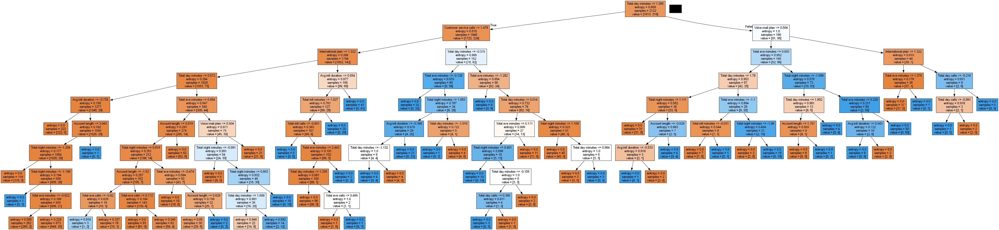

In [65]:
# Assume `feature_names` is a list of column names corresponding to your dataset
feature_names = x_train.columns if hasattr(x_train, 'columns') else [f'Feature {i}' for i in range(x_train.shape[1])]

# Create an output destination for the file
dot_data = StringIO()

# Use feature_names to label the nodes with column names
export_graphviz(Tree, out_file=dot_data, feature_names=feature_names, filled=True)

# Generate the graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

# Save and display the tree image
filename = 'tree.png'
graph.write_png(filename)
Image(filename=filename)

* Decision Tree cross-validation

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       476
           1       0.71      0.84      0.77        58

    accuracy                           0.95       534
   macro avg       0.85      0.90      0.87       534
weighted avg       0.95      0.95      0.95       534

Accuracy of DT classifier on training set: 0.98
Accuracy of DT classifier on test set: 0.95

ROC AUC Score: 0.8453950444132773


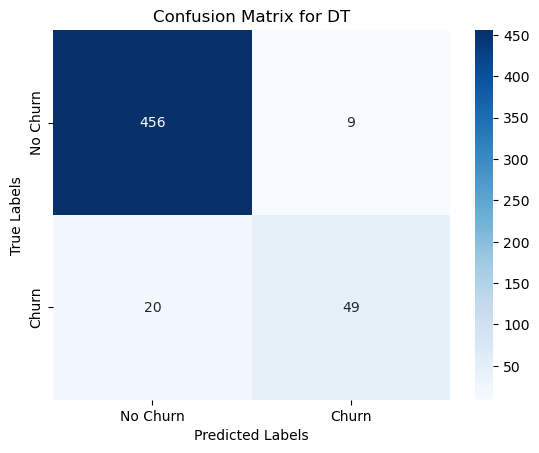

In [66]:
y_pred_dt = Tree.predict(x_test)
print(classification_report(y_pred_dt, y_test))
print('Accuracy of DT classifier on training set: {:.2f}'
     .format(Tree.score(x_train, y_train)))
print('Accuracy of DT classifier on test set: {:.2f}'
     .format(Tree.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_dt))

# Plotting the Confusion Matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for DT')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

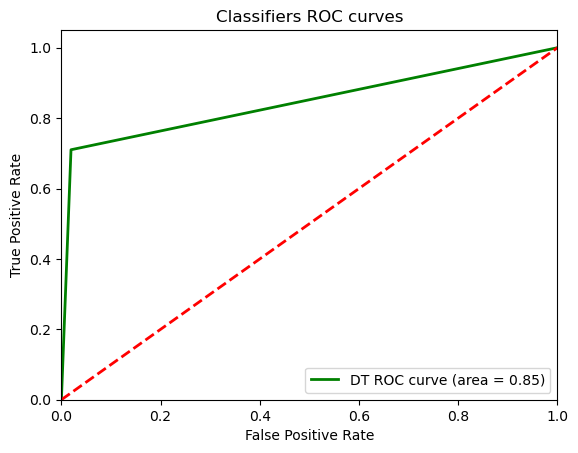

In [67]:
# Calculate the false positive rate and true positive rate
fpr_dt, tpr_dt, threshold_dt = roc_curve(y_test, y_pred_dt)
roc_auc_dt = auc(fpr_dt, tpr_dt)

plt.figure()

plt.plot(fpr_dt, tpr_dt, color='green', lw=2, label='DT ROC curve (area = %0.2f)'% roc_auc_dt)

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

* With an accuracy as high as (0.95) with the highest yet precision-recall tradeoff in Churn (0.84 and 0.71) in addition to an AUC of (0.85), it seems that the Decision Tree is a great model for our dataset.
* We will check **Ensemble** (Bagging & Boosting) methods since they're supposed to boost the performance of the Decision Tree model.

5.5 **Random Forest**

* GridSearchCV for best hyperparameters

In [68]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()

param_grid = {'n_estimators': [2*n+1 for n in range(20)],
             'max_depth' : [2*n+1 for n in range(10) ],
             'max_features':["auto", "sqrt", "log2"]}

search = GridSearchCV(estimator=model, param_grid=param_grid,scoring='accuracy', cv=3)
search.fit(x_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21,
                                          23, 25, 27, 29, 31, 33, 35, 37, 39]},
             scoring='accuracy')

In [69]:
search.best_score_
search.best_params_

{'max_depth': 19, 'max_features': 'log2', 'n_estimators': 39}

* Random Forest using tuned hyperparameters

In [70]:
RF = RandomForestClassifier(max_features="log2", max_depth = 19, n_estimators=39, random_state=10)
RF
RF.fit(x_train,y_train)

RandomForestClassifier(max_depth=19, max_features='log2', n_estimators=39,
                       random_state=10)

* Random Forest cross-validation

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       482
           1       0.72      0.96      0.83        52

    accuracy                           0.96       534
   macro avg       0.86      0.96      0.90       534
weighted avg       0.97      0.96      0.96       534

Accuracy of RF classifier on training set: 1.00
Accuracy of RF classifier on test set: 0.96

ROC AUC Score: 0.8601683029453016


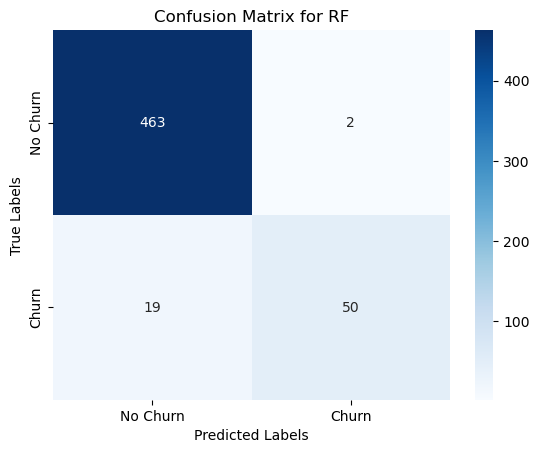

In [71]:
y_pred_rf = RF.predict(x_test)
print(classification_report(y_pred_rf, y_test))
print('Accuracy of RF classifier on training set: {:.2f}'
     .format(RF.score(x_train, y_train)))
print('Accuracy of RF classifier on test set: {:.2f}'
     .format(RF.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_rf))

# Plotting the Confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for RF')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

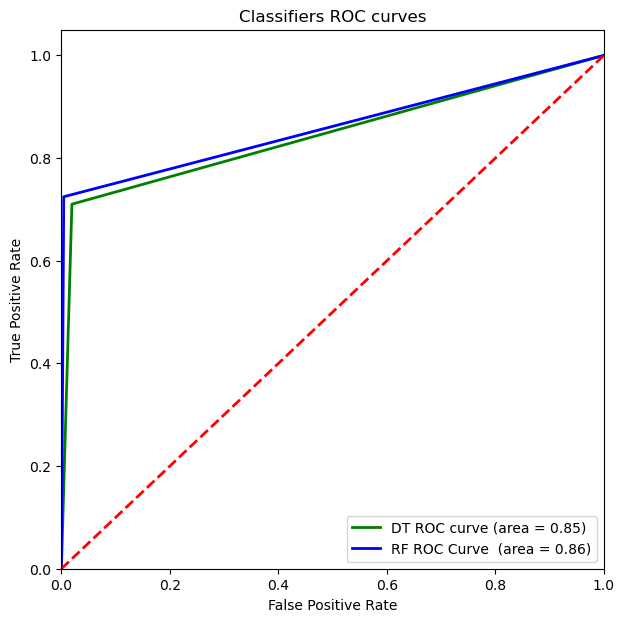

In [72]:
fpr_rf, tpr_rf, threshold_rf = roc_curve(y_test, y_pred_rf)
roc_auc_rf = auc(fpr_rf, tpr_rf)
plt.figure(figsize=(7,7))
plt.plot(fpr_dt, tpr_dt, color='green', lw=2, label='DT ROC curve (area = %0.2f)'% roc_auc_dt)
plt.plot(fpr_rf, tpr_rf, color='blue', lw=2, label='RF ROC Curve  (area = %0.2f)'% roc_auc_rf)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

* The Random Forest is performing well with an accuracy of 96% and an AUC of 0.86, suggesting that the model is a bit more consistent in distinguishing between the classes when compared to the Decision Tree.
* Combining both metrics, adopting decision RF model for our dataset would be better in this case.

5.6 Adaptive Boosting (AdaBoost)

* GridSearchCV for best hyperparameters

In [74]:
from sklearn.ensemble import AdaBoostClassifier
model = AdaBoostClassifier()
param_grid = {'learning_rate': [0.1*(n+1) for n in range(10)],
             'n_estimators' : [2*n+1 for n in range(10)],
              'algorithm':['SAMME', 'SAMME.R']}
search = GridSearchCV(estimator=model, param_grid=param_grid,scoring='f1', cv=5)
search.fit(x_train, y_train)
search.best_score_
search.best_params_

{'algorithm': 'SAMME.R', 'learning_rate': 0.9, 'n_estimators': 15}

* AdaBoost using tuned hyperparameters

              precision    recall  f1-score   support

           0       0.97      0.91      0.94       494
           1       0.39      0.68      0.50        40

    accuracy                           0.90       534
   macro avg       0.68      0.79      0.72       534
weighted avg       0.93      0.90      0.91       534

Accuracy of AdaBoost classifier on training set: 0.88
Accuracy of AdaBoost classifier on test set: 0.90

ROC AUC Score: 0.6816736792893875


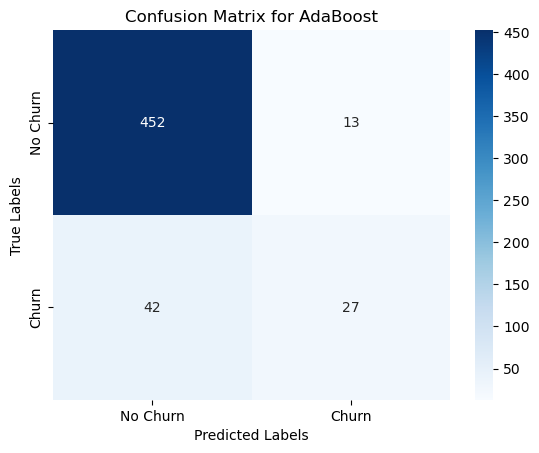

In [75]:
model = AdaBoostClassifier(algorithm= 'SAMME.R', learning_rate=0.9, n_estimators= 15,random_state=0)
model.fit(x_train, y_train)
y_pred_adaboost = model.predict(x_test)

print(classification_report(y_pred_adaboost, y_test))
print('Accuracy of AdaBoost classifier on training set: {:.2f}'
     .format(model.score(x_train, y_train)))
print('Accuracy of AdaBoost classifier on test set: {:.2f}'
     .format(model.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_adaboost))

# Plotting the Confusion Matrix
cm_adaboost = confusion_matrix(y_test, y_pred_adaboost)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_adaboost, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for AdaBoost')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

* Adaboost ROC Curve comparison

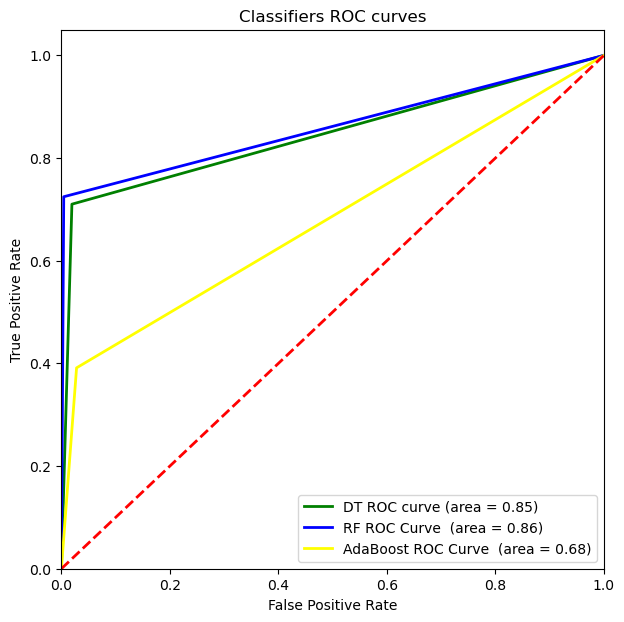

In [76]:
fpr_ad, tpr_ad, threshold_ad = roc_curve(y_test, y_pred_adaboost)
roc_auc_ad = auc(fpr_ad, tpr_ad)
plt.figure(figsize=(7,7))
plt.plot(fpr_dt, tpr_dt, color='green', lw=2, label='DT ROC curve (area = %0.2f)'% roc_auc_dt)
plt.plot(fpr_rf, tpr_rf, color='blue', lw=2, label='RF ROC Curve  (area = %0.2f)'% roc_auc_rf)
plt.plot(fpr_ad, tpr_ad, color='yellow', lw=2, label='AdaBoost ROC Curve  (area = %0.2f)'% roc_auc_ad)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

* The Random Forest is performing well with an accuracy of 90% but in comparison with our previous ensemble method lower. However, its AUC (0.69) is lower than that of the Decision Tree (0.85) and Random Forest (0.86), meaning that the model is less consistent in distinguishing between the classes when compared to the Decision Tree since it has lower precision and recall for the Churn class.
* Since AUC is a more trustworthy metric, keeping RF model for our dataset would be better in this case.

5.7 XGBoost

* **GridSearchCV for best hyperparameters**

In [77]:
from xgboost import XGBClassifier

# Initialize the XGBClassifier
xgc = XGBClassifier(objective='binary:logistic', random_state=42)

# Define the parameter grid
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 150],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=xgc, param_grid=param_grid, cv=3, verbose=1, n_jobs=-1, scoring='f1')

# Fit GridSearchCV
grid_search.fit(x_train, y_train)

# Get the best parameters and best score
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy found: ", grid_search.best_score_)

Fitting 3 folds for each of 972 candidates, totalling 2916 fits
Best parameters found:  {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}
Best accuracy found:  0.7998617579974315


* Evaluate XGBoost using tuned hyperparameters

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       482
           1       0.74      0.98      0.84        52

    accuracy                           0.96       534
   macro avg       0.87      0.97      0.91       534
weighted avg       0.97      0.96      0.97       534

Accuracy of AdaBoost classifier on training set: 0.99
Accuracy of AdaBoost classifier on test set: 0.96

ROC AUC Score: 0.8684899485741


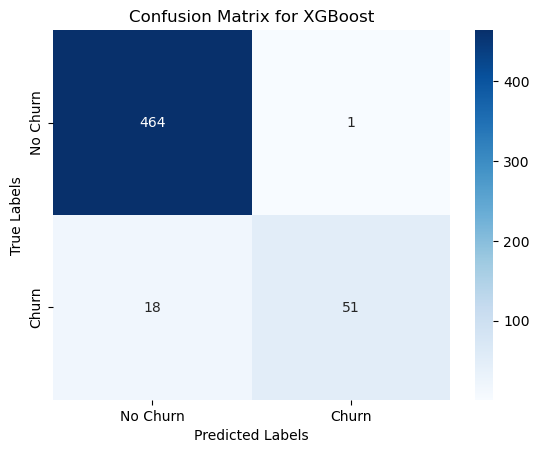

In [78]:
xgc_tuned = XGBClassifier(objective='binary:logistic', random_state=42,
                          colsample_bytree= 1.0, gamma= 0,
                          learning_rate= 0.2, max_depth= 5,
                          n_estimators= 50, subsample= 0.8)
xgc_tuned.fit(x_train, y_train)
y_pred_xg = xgc_tuned.predict(x_test)

print(classification_report(y_pred_xg, y_test))
print('Accuracy of AdaBoost classifier on training set: {:.2f}'
     .format(xgc_tuned.score(x_train, y_train)))
print('Accuracy of AdaBoost classifier on test set: {:.2f}'
     .format(xgc_tuned.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_xg))

# Plotting the Confusion Matrix
cm_xg = confusion_matrix(y_test, y_pred_xg)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_xg, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for XGBoost')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

* Ensemble methods cross-validation with Decision tree

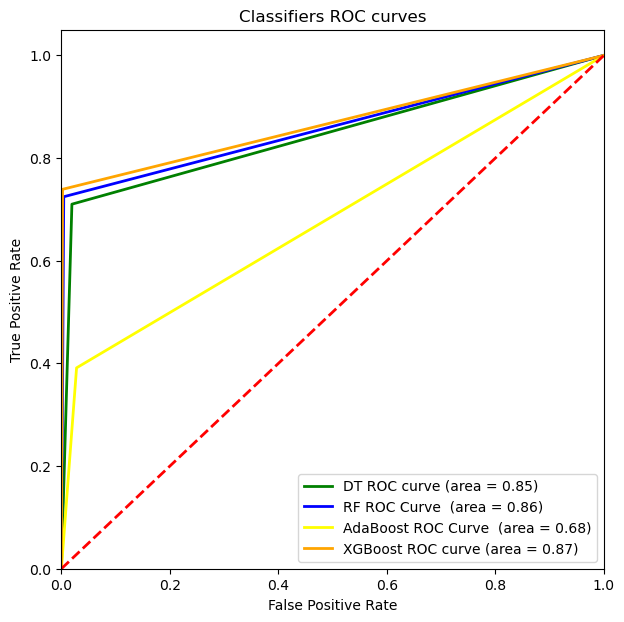

In [79]:
fpr_xg, tpr_xg, threshold_xg = roc_curve(y_test, y_pred_xg)
roc_auc_xg = auc(fpr_xg, tpr_xg)
plt.figure(figsize=(7,7))
plt.plot(fpr_dt, tpr_dt, color='green', lw=2, label='DT ROC curve (area = %0.2f)'% roc_auc_dt)
plt.plot(fpr_rf, tpr_rf, color='blue', lw=2, label='RF ROC Curve  (area = %0.2f)'% roc_auc_rf)
plt.plot(fpr_ad, tpr_ad, color='yellow', lw=2, label='AdaBoost ROC Curve  (area = %0.2f)'% roc_auc_ad)
plt.plot(fpr_xg, tpr_xg, color='orange', lw=2, label='XGBoost ROC curve (area = %0.2f)'% roc_auc_xg)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

* XGBoost has the highest accuracy of all (0.96) coupled with the best AUC (0.87) making it the best model for our dataset.
* So it's the best at predicting and at distinguishing between Churn and No Churn.

5.8 Neural Network

 * GridSearchCV for tuned hyperparameters

In [80]:
from sklearn.neural_network import MLPClassifier

param_grid = {
    'hidden_layer_sizes': [(5, 5),(5, 6), (5, 5, 5)],
    'activation': ['logistic', 'relu', 'tanh'],  
    'solver': ['adam', 'sgd', 'lbfgs'],  
    'max_iter': [1000, 2000],  # Include a range of iterations.
    'random_state': [42],  # Multiple values for consistency checks.
    'alpha': [0.0001, 0.001, 0.01, 0.2],  # Expanded range for L2 regularization.
}

mlp = MLPClassifier(random_state=42)

grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1,scoring='f1')

grid_search.fit(x_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best score found: ", grid_search.best_score_)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters found:  {'activation': 'logistic', 'alpha': 0.2, 'hidden_layer_sizes': (5, 5), 'max_iter': 1000, 'random_state': 42, 'solver': 'lbfgs'}
Best score found:  0.812469083171466


* Evaluate Neural Network using tuned hyperparameters

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       475
           1       0.75      0.88      0.81        59

    accuracy                           0.96       534
   macro avg       0.87      0.92      0.89       534
weighted avg       0.96      0.96      0.96       534

Accuracy of Neural Network classifier on training set: 0.99
Accuracy of Neural Network classifier on test set: 0.96

ROC AUC Score: 0.8692847124824685


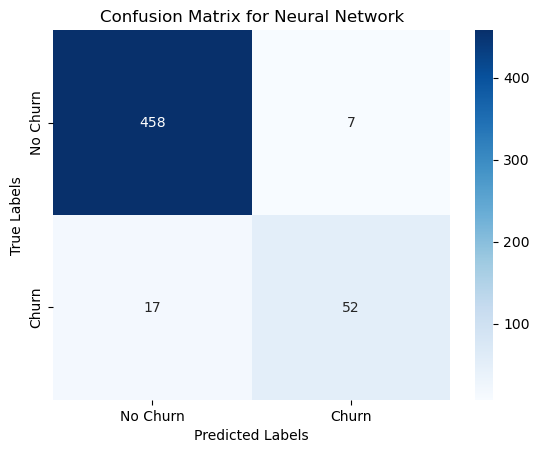

In [81]:
best_mlp = grid_search.best_estimator_
y_pred_best_neural = best_mlp.predict(x_test)

print(classification_report(y_pred_best_neural, y_test))
print('Accuracy of Neural Network classifier on training set: {:.2f}'
     .format(xgc_tuned.score(x_train, y_train)))
print('Accuracy of Neural Network classifier on test set: {:.2f}'
     .format(xgc_tuned.score(x_test, y_test)))
print("\nROC AUC Score:", roc_auc_score(y_test, y_pred_best_neural))

# Plotting the Confusion Matrix
cm_nn = confusion_matrix(y_test, y_pred_best_neural)

# Plot the heatmap for the confusion matrix
sns.heatmap(cm_nn, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.title('Confusion Matrix for Neural Network')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

* ROC Curve Comparison

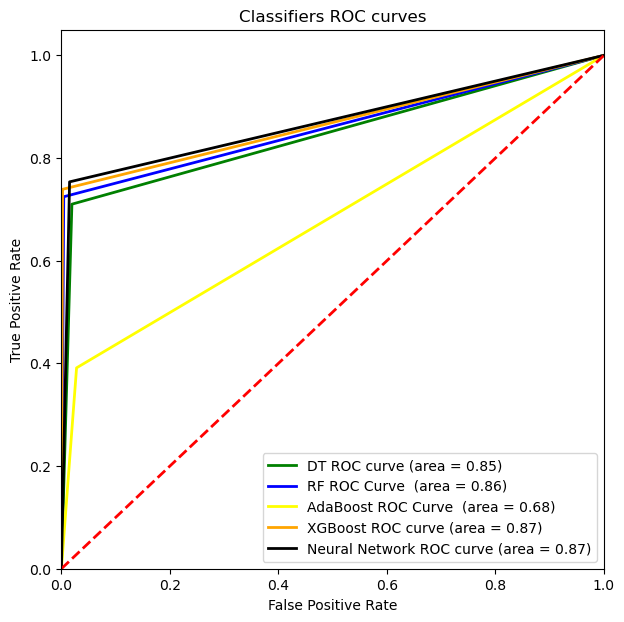

In [82]:
fpr_nn, tpr_nn, threshold_nn = roc_curve(y_test, y_pred_best_neural)
roc_auc_nn = auc(fpr_nn, tpr_nn)
plt.figure(figsize=(7,7))
plt.plot(fpr_dt, tpr_dt, color='green', lw=2, label='DT ROC curve (area = %0.2f)'% roc_auc_dt)
plt.plot(fpr_rf, tpr_rf, color='blue', lw=2, label='RF ROC Curve  (area = %0.2f)'% roc_auc_rf)
plt.plot(fpr_ad, tpr_ad, color='yellow', lw=2, label='AdaBoost ROC Curve  (area = %0.2f)'% roc_auc_ad)
plt.plot(fpr_xg, tpr_xg, color='orange', lw=2, label='XGBoost ROC curve (area = %0.2f)'% roc_auc_xg)
plt.plot(fpr_nn, tpr_nn, color='black', lw=2, label='Neural Network ROC curve (area = %0.2f)'% roc_auc_nn)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classifiers ROC curves')
plt.legend(loc = "lower right")
plt.show()

Neural Network and XGBoost have similar accuracy and AUC however XGBoost has better F1-scores meaning it fits my imbalanced class better.

# 6. Summarized Evaluation


---



In [83]:
#gives model report in dataframe
def model_report(model, training_x, testing_x, training_y, testing_y, name):
    model = model.fit(training_x, training_y)
    predictions = model.predict(testing_x)
    accuracy = accuracy_score(testing_y, predictions)
    recallscore = recall_score(testing_y, predictions)
    precision = precision_score(testing_y, predictions)
    roc_auc = roc_auc_score(testing_y, predictions)
    f1score = f1_score(testing_y, predictions)

    df = pd.DataFrame({"Model"           : [name],
                       "Accuracy"        : [accuracy],
                       "Recall"          : [recallscore],
                       "Precision"       : [precision],
                       "f1-score"        : [f1score],
                       "Roc_auc"         : [roc_auc],
                      })
    return df

In [84]:
logit = LogisticRegression(C=100.0, max_iter=1000, verbose=2, n_jobs=-1)

logit_smote = LogisticRegression(C=0.01, max_iter=1000, verbose=2, n_jobs=-1)

knn = KNeighborsClassifier(3,p=1)

knn_smote = KNeighborsClassifier(2,p=2)

svc_rbf  = SVC(kernel="rbf", class_weight="balanced")

svc_poly  = SVC(kernel="poly", class_weight="balanced")

In [85]:
models = {'Logistic (Baseline)': [logit, cols],
          'Logistic (SMOTE)': [logit_smote, cols],
          'KNN': [knn, cols],
          'KNN (SMOTE)': [knn_smote, cols],
          'SVM (rbf)': [svc_rbf, cols],
          'SVM (polynomial)': [svc_poly, cols],
          'Decision Tree': [Tree, cols],
          'Random Forest': [RF, cols],
          'AdaBoost': [model, cols],
          'XGBoost': [xgc_tuned, cols],
          'Neural Network' : [best_mlp, cols],
         }

* Evaluation over the testing subset evaluation (20% of telcom)

In [86]:
# Outputs for all models over the training dataset
model_performances_train = pd.DataFrame()
for name in models:
    if name in ['Logistic (SMOTE)', 'KNN (SMOTE)']:
        df_temp = model_report(models[name][0], 
                               x_smote[models[name][1]], x_test[models[name][1]], 
                               y_smote, y_test, name)
    else:
        df_temp = model_report(models[name][0], 
                               x_train[models[name][1]], x_test[models[name][1]], 
                               y_train, y_test, name)

    # Use pd.concat instead of append
    model_performances_train = pd.concat([model_performances_train, df_temp], ignore_index=True)

table_train = ff.create_table(np.round(model_performances_train, 4))
py.iplot(table_train)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished


* Evaluation over the principal training set (telcom_test)

In [87]:
# Outputs for all models over the principal test dataset
model_performances_test = pd.DataFrame()
for name in models:
    if name in ['Logistic (SMOTE)', 'KNN (SMOTE)']:
        df_temp = model_report(models[name][0],
                               x_smote[models[name][1]], telcom_test[models[name][1]],
                               y_smote, telcom_test[target_col], name)
    else:
        df_temp = model_report(models[name][0],
                               x_train[models[name][1]], telcom_test[models[name][1]],
                               y_train, telcom_test[target_col], name)

    model_performances_test = pd.concat([model_performances_test, df_temp], ignore_index=True)

table_test = ff.create_table(np.round(model_performances_test, 4))
py.iplot(table_test)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished


* The evaluation on principal testing dataset telcom_test doesn't deviate much from our initial evaluations.
* As a matter of fact, XGBoost possesses the highest f1-score coupled with the best precision recall trade-off as well as the highest accuracy.
* Thus XGBoost is the best model for our dataset whether it be for training or testing and we will use it for deployment.

# 6. SHAP to evalute the most important features
---

In [88]:
!pip install shap

In [89]:
test_cols = [i for i in telcom_test.columns if i not in target_col]
X = telcom_test[test_cols]
Y = telcom_test[target_col]

In [90]:
import shap
# Initialize the SHAP explainer for your XGBoost model
explainer = shap.Explainer(xgc_tuned, x_train)

# Calculate SHAP values for the test set
shap_values = explainer(X)

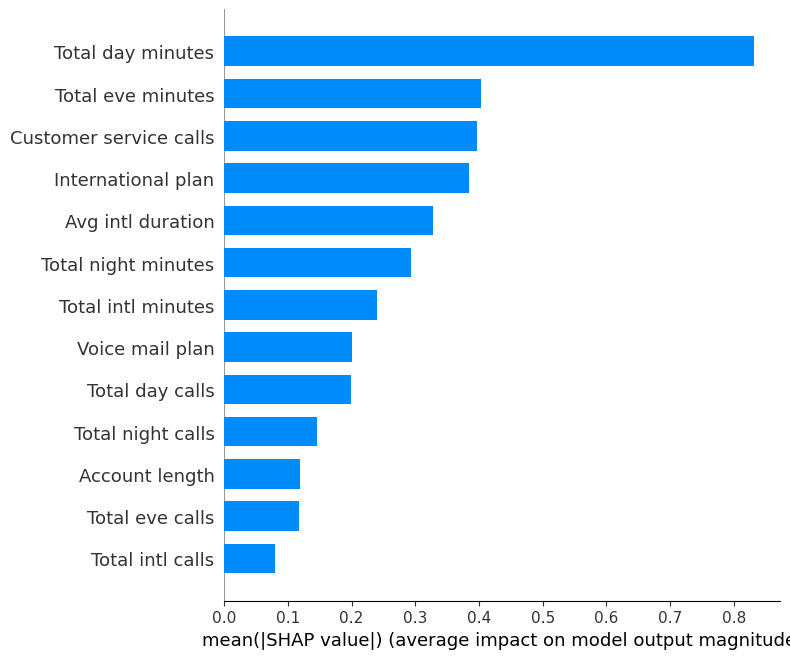

In [91]:
# Bar plot of mean absolute SHAP values for feature importance
shap.summary_plot(shap_values, X, plot_type="bar")

This proves our previously correlation matrix study that our most important features are total minutes (day/eve/night), customer service calls, international plan and voice plan.

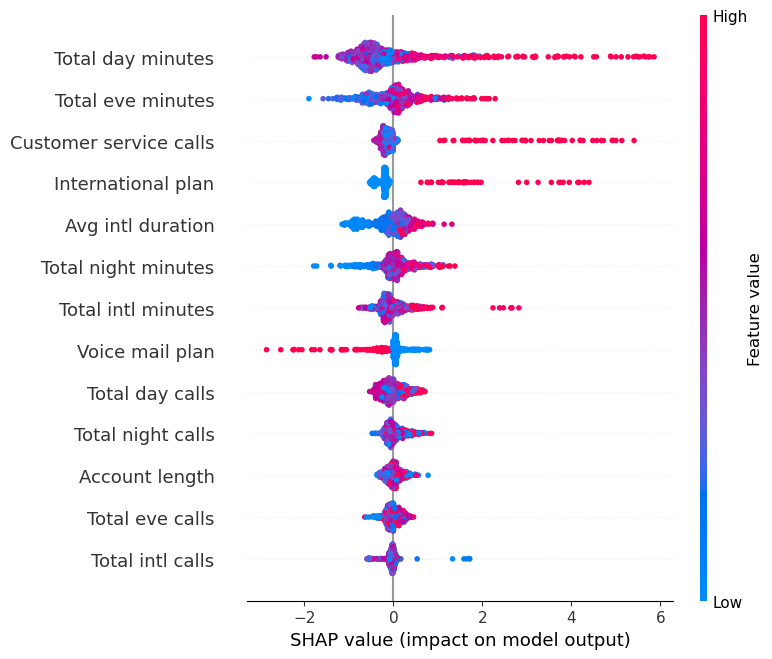

In [92]:
# Generate SHAP summary scatter plot
shap.summary_plot(shap_values, X)

This aggregated with positive / negative coefficients of the correlation matrix proves that :
* The higher total day minutes, total eve minutes, customer service calls and the posession of an international plan the more likely a customer is to churn
* The lower avg intl duration, total night minutes and the absence of a voice mail plan the more likely a customer is to churn

In [93]:
import joblib

joblib.dump(xgc_tuned, 'modelXGB.pkl')
joblib.dump(std, 'scaler.pkl')

['scaler.pkl']

# 7. Deployment
---

We will deploy our best model XGBoost using flask to test churn prediction.

* Example 1

International Plan:      No  
Voice Mail Plan:         No  
Avg Intl Duration:       2.175                                               
Total Day Minutes:       184.5                                               
Total Eve Minutes:       351.6  
Total Night Minutes:     215.8  
Total Intl Minutes:      8.7  
Total Intl Calls:        4  
Customer Service Calls:  1                                                   
Account Length:          117  
Total Day Calls:         97  
Total Eve Calls:         80  
Total Night Calls:       90  

Churn:                   **False**

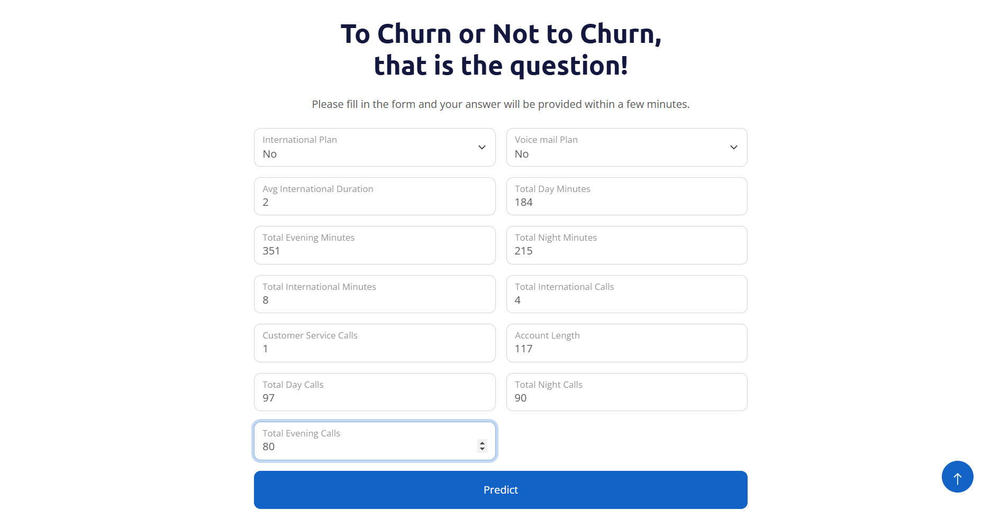

Will it predict it correctly as No Churn ?

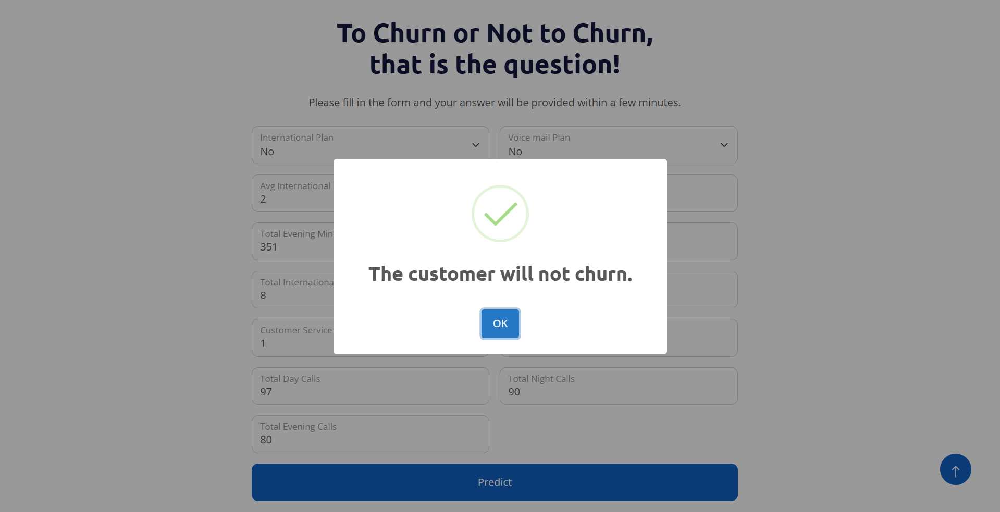

* Example 2

International Plan:      No  
Voice Mail Plan:         No  
Avg Intl Duration:       2.11  
Total Day Minutes:       129.1  
Total Eve Minutes:       228.5  
Total Night Minutes:     208.8  
Total Intl Minutes:      12.7  
Total Intl Calls:        6  
Customer Service Calls:  4  
Account Length:          65  
Total Day Calls:         137  
Total Eve Calls:         83  
Total Night Calls:       111  

Churn:                   **True**


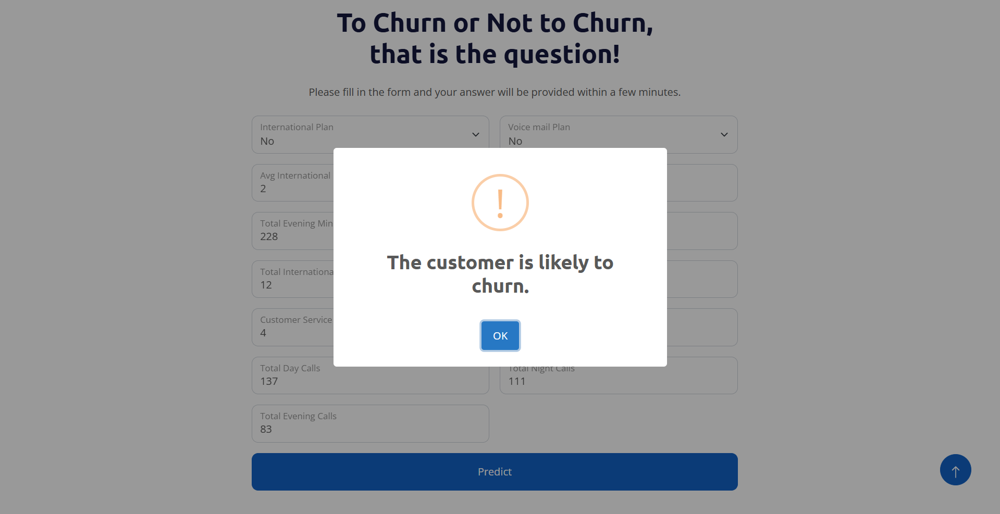

Correct prediction again!